<a href="https://colab.research.google.com/github/YonghwanYim/RL-toy-example/blob/main/RL_Toy_Example_18.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Supervised Learning + RL
(NASA C-MAPSS dataset)

# Data Handling

Connect with Google Drive

In [9]:
from google.colab import drive
drive.mount('content')

Drive already mounted at content; to attempt to forcibly remount, call drive.mount("content", force_remount=True).


Importing libraries

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import sklearn
from sklearn.metrics import mean_squared_error, r2_score
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import random
import warnings
np.random.seed(34)
warnings.filterwarnings('ignore')

Defining features names

In [11]:
index_names = ['unit_number', 'time_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['s_{}'.format(i+1) for i in range(0,21)]
col_names = index_names + setting_names + sensor_names

Importing train and validation data

* Data Set : FD001
* Train trajectories : 100
* Test trajectories : 100
* Conditions : ONE (Sea Level)
* Fault Modes : ONE (HPC Degradation)

Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. here are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data is contaminated with sensor noise.

The engine is operating normally at the start of each time series, and develops a fault at some point during the series. In the training set, the fault grows in magnitude until system failure. In the test set, the time series ends some time prior to system failure. The objective of the competition is to predict the number of remaining operational cycles before failure in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate. Also provided a vector of true Remaining Useful Life (RUL) values for the test data.





**Data Set: FD002**
*   Train trjectories: 260
*   Conditions: SIX
*   Fault Modes: ONE (HPC Degradation)

**Data Set: FD003**
* Train trjectories: 100
* Conditions: ONE (Sea Level)
* Fault Modes: TWO (HPC Degradation, Fan Degradation)

**Data Set: FD004**
* Train trjectories: 249
* Conditions: SIX
* Fault Modes: TWO (HPC Degradation, Fan Degradation)

In [12]:
dftrain = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/train_FD002_1_130.txt',sep='\s+',header=None,index_col=False,names=col_names)
dfvalid = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/train_FD002_131_260.txt',sep='\s+',header=None,index_col=False,names=col_names)
dffull_data = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/train_FD002.txt',sep='\s+',header=None,index_col=False,names=col_names)
# y_valid : A vector of true Remaining Useful Life (RUL) values for the test data.
# y_valid = pd.read_csv('/content/content/MyDrive/Colab Notebooks/NASA_Turbofan_Data/RUL_FD001.txt',sep='\s+',header=None,index_col=False,names=['RUL'])
# dfvalid.shape

In [13]:
train = dftrain.copy() # Engine 1~70 (dataset 1)
valid = dfvalid.copy() # Engine 71~100 (dataset 1)
full_data = dffull_data.copy() # Engine 1~100 (dataset 1)

Data inspection

In [14]:
train

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,183.06,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,130.42,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,164.22,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,130.72,2387.61,8068.66,9.3528,0.02,329,2212,100.00,10.59,6.4701
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,164.31,2028.00,7861.23,10.8963,0.02,309,1915,84.93,14.13,8.5286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26853,130,178,35.0023,0.8400,100.0,449.44,556.32,1377.02,1142.68,5.48,...,182.21,2387.61,8045.16,9.4179,0.02,337,2223,100.00,14.50,8.9210
26854,130,179,42.0037,0.8405,100.0,445.00,550.44,1360.14,1140.99,3.91,...,129.98,2387.21,8060.00,9.4873,0.02,333,2212,100.00,10.32,6.3860
26855,130,180,24.9995,0.6200,60.0,462.54,537.27,1264.30,1070.30,7.05,...,163.91,2027.74,7858.76,11.0147,0.02,309,1915,84.93,13.96,8.5782
26856,130,181,20.0035,0.7000,100.0,491.19,608.34,1497.35,1267.30,9.35,...,313.95,2388.19,8038.97,9.3322,0.03,369,2324,100.00,24.31,14.5084


In [15]:
valid

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,131,1,41.9996,0.8417,100.0,445.00,548.77,1355.19,1124.01,3.91,...,131.11,2387.97,8083.07,9.3369,0.02,328,2212,100.00,10.50,6.3679
1,131,2,41.9996,0.8411,100.0,445.00,549.12,1356.03,1118.15,3.91,...,130.82,2387.90,8074.19,9.3423,0.02,329,2212,100.00,10.59,6.4255
2,131,3,0.0005,0.0006,100.0,518.67,642.63,1585.02,1395.48,14.62,...,521.88,2388.02,8135.08,8.4228,0.03,393,2388,100.00,39.01,23.4155
3,131,4,0.0011,0.0000,100.0,518.67,641.90,1580.80,1399.71,14.62,...,522.58,2388.03,8132.31,8.4028,0.03,395,2388,100.00,39.01,23.3156
4,131,5,20.0040,0.7000,100.0,491.19,607.07,1479.34,1242.09,9.35,...,315.64,2388.03,8055.53,9.2115,0.02,364,2324,100.00,24.36,14.9172
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26896,260,312,20.0037,0.7000,100.0,491.19,608.79,1495.60,1269.51,9.35,...,314.05,2389.02,8169.64,9.3035,0.03,369,2324,100.00,24.36,14.5189
26897,260,313,10.0022,0.2510,100.0,489.05,605.81,1514.32,1324.12,10.52,...,371.22,2388.42,8245.36,8.7586,0.03,374,2319,100.00,28.10,16.9454
26898,260,314,25.0041,0.6200,60.0,462.54,537.48,1276.24,1057.92,7.05,...,163.74,2030.33,7971.25,11.0657,0.02,310,1915,84.93,14.19,8.5503
26899,260,315,25.0033,0.6220,60.0,462.54,537.84,1272.95,1066.30,7.05,...,164.37,2030.35,7972.47,11.0537,0.02,311,1915,84.93,14.05,8.3729


In [16]:
full_data

,unit_number,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,183.06,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,130.42,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,164.22,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,130.72,2387.61,8068.66,9.3528,0.02,329,2212,100.00,10.59,6.4701
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,164.31,2028.00,7861.23,10.8963,0.02,309,1915,84.93,14.13,8.5286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53754,260,312,20.0037,0.7000,100.0,491.19,608.79,1495.60,1269.51,9.35,...,314.05,2389.02,8169.64,9.3035,0.03,369,2324,100.00,24.36,14.5189
53755,260,313,10.0022,0.2510,100.0,489.05,605.81,1514.32,1324.12,10.52,...,371.22,2388.42,8245.36,8.7586,0.03,374,2319,100.00,28.10,16.9454
53756,260,314,25.0041,0.6200,60.0,462.54,537.48,1276.24,1057.92,7.05,...,163.74,2030.33,7971.25,11.0657,0.02,310,1915,84.93,14.19,8.5503
53757,260,315,25.0033,0.6220,60.0,462.54,537.84,1272.95,1066.30,7.05,...,164.37,2030.35,7972.47,11.0537,0.02,311,1915,84.93,14.05,8.3729


In [17]:
print('Shape of the train dataset : ',train.shape)
print('Shape of the validation dataset : ',valid.shape)
print('Percentage of the validation dataset : ',len(valid)/(len(valid)+len(train)))

Shape of the train dataset :  (26858, 26)
Shape of the validation dataset :  (26901, 26)
Percentage of the validation dataset :  0.5003999330344686


In [18]:
# Checking the presence of Nan values
print('Total None value in the train dataset : ', train.isna().sum())
print('Total None value in the valid dataset : ', valid.isna().sum())

Total None value in the train dataset :  unit_number    0
time_cycles    0
setting_1      0
setting_2      0
setting_3      0
s_1            0
s_2            0
s_3            0
s_4            0
s_5            0
s_6            0
s_7            0
s_8            0
s_9            0
s_10           0
s_11           0
s_12           0
s_13           0
s_14           0
s_15           0
s_16           0
s_17           0
s_18           0
s_19           0
s_20           0
s_21           0
dtype: int64
Total None value in the valid dataset :  unit_number    0
time_cycles    0
setting_1      0
setting_2      0
setting_3      0
s_1            0
s_2            0
s_3            0
s_4            0
s_5            0
s_6            0
s_7            0
s_8            0
s_9            0
s_10           0
s_11           0
s_12           0
s_13           0
s_14           0
s_15           0
s_16           0
s_17           0
s_18           0
s_19           0
s_20           0
s_21           0
dtype: int64


In [19]:
train.loc[:,['unit_number','time_cycles']].describe()

,unit_number,time_cycles
count,26858.000000,26858.000000
mean,66.994974,109.510723
std,37.713575,70.288474
min,1.000000,1.000000
25%,34.000000,52.000000
50%,68.000000,104.000000
75%,100.000000,156.000000
max,130.000000,378.000000


In [20]:
train.loc[:,'s_1':].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
s_1,26858.0,472.869814,26.379637,445.0000,445.000000,462.5400,491.1900,518.6700
s_2,26858.0,579.525200,37.323571,535.6800,549.550000,555.9300,607.3100,644.3800
s_3,26858.0,1419.245994,106.117210,1245.8100,1352.430000,1368.6900,1498.9600,1610.8700
s_4,26858.0,1204.507670,119.174402,1030.0800,1123.060000,1138.3300,1306.1600,1439.2300
s_5,26858.0,8.024600,3.611394,3.9100,3.910000,7.0500,10.5200,14.6200
s_6,26858.0,11.586611,5.428751,5.7100,5.720000,9.0300,15.4900,21.6100
s_7,26858.0,282.139384,145.966229,136.8000,139.882500,194.6800,394.0900,555.8200
s_8,26858.0,2228.013180,145.921563,1914.7700,2211.890000,2223.0800,2323.9600,2388.3500
s_9,26858.0,8524.083668,336.476898,7985.5600,8321.840000,8361.5350,8778.2800,9215.6600
s_10,26858.0,1.094175,0.127348,0.9300,1.020000,1.0200,1.2600,1.3000


Data Visualization & Feature Engineering


Max time cycle found for each Unit

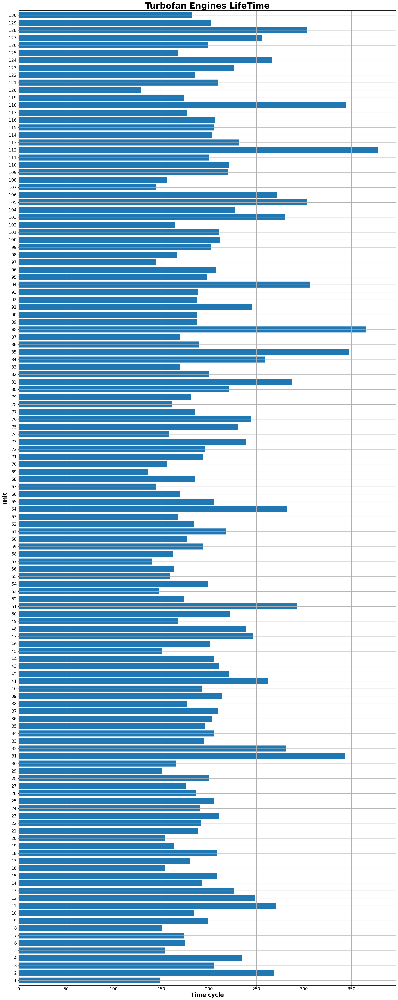

In [21]:
max_time_cycles=train[index_names].groupby('unit_number').max()  # unit_number = Index of Jet Engine (dataset 1 : 1~100)
plt.figure(figsize=(20,50))
ax=max_time_cycles['time_cycles'].plot(kind='barh',width=0.8, stacked=True,align='center')
plt.title('Turbofan Engines LifeTime',fontweight='bold',size=30)
plt.xlabel('Time cycle',fontweight='bold',size=20)
plt.xticks(size=15)
plt.ylabel('unit',fontweight='bold',size=20)
plt.yticks(size=15)
plt.grid(True)
plt.tight_layout()
plt.show()

Text(0.5, 9.444444444444459, 'max time cycle')

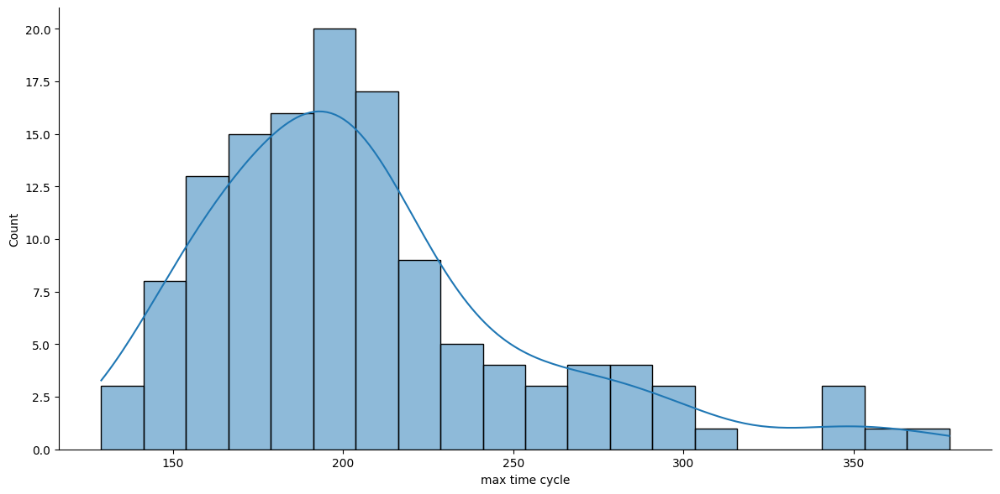

In [22]:
#Distribution of maximum time cycles
sns.displot(max_time_cycles['time_cycles'],kde=True,bins=20,height=6,aspect=2)
plt.xlabel('max time cycle')

Add RUL column to the data

RUL corresponds to the remaining time cycles for each unit before it falls.

In [23]:
def add_RUL_column(df):
    train_grouped_by_unit = df.groupby(by='unit_number')
    max_time_cycles = train_grouped_by_unit['time_cycles'].max()
    merged = df.merge(max_time_cycles.to_frame(name='max_time_cycle'), left_on='unit_number',right_index=True)
    merged["RUL"] = merged["max_time_cycle"] - merged['time_cycles']
    merged = merged.drop("max_time_cycle", axis=1)
    return merged

In [24]:
train = add_RUL_column(train)
valid = add_RUL_column(valid)
full_data = add_RUL_column(full_data)

In [25]:
train[['unit_number','RUL']] # Jet Engine 1~70 (total : 70)

,unit_number,RUL
0,1,148
1,1,147
2,1,146
3,1,145
4,1,144
...,...,...
26853,130,4
26854,130,3
26855,130,2
26856,130,1


In [26]:
valid[['unit_number','RUL']] # Jet Engine 71~100 (total : 30)

,unit_number,RUL
0,131,279
1,131,278
2,131,277
3,131,276
4,131,275
...,...,...
26896,260,4
26897,260,3
26898,260,2
26899,260,1


In [27]:
full_data[['unit_number', 'RUL']]

,unit_number,RUL
0,1,148
1,1,147
2,1,146
3,1,145
4,1,144
...,...,...
53754,260,4
53755,260,3
53756,260,2
53757,260,1


In [28]:
Sensor_dictionary={}
dict_list=[ "(Fan inlet temperature) (◦R)",
"(LPC outlet temperature) (◦R)",
"(HPC outlet temperature) (◦R)",
"(LPT outlet temperature) (◦R)",
"(Fan inlet Pressure) (psia)",
"(bypass-duct pressure) (psia)",
"(HPC outlet pressure) (psia)",
"(Physical fan speed) (rpm)",
"(Physical core speed) (rpm)",
"(Engine pressure ratio(P50/P2)",
"(HPC outlet Static pressure) (psia)",
"(Ratio of fuel flow to Ps30) (pps/psia)",
"(Corrected fan speed) (rpm)",
"(Corrected core speed) (rpm)",
"(Bypass Ratio) ",
"(Burner fuel-air ratio)",
"(Bleed Enthalpy)",
"(Required fan speed)",
"(Required fan conversion speed)",
"(High-pressure turbines Cool air flow)",
"(Low-pressure turbines Cool air flow)" ]
i=1
for x in dict_list :
    Sensor_dictionary['s_'+str(i)]=x
    i+=1
Sensor_dictionary

{'s_1': '(Fan inlet temperature) (◦R)',
 's_2': '(LPC outlet temperature) (◦R)',
 's_3': '(HPC outlet temperature) (◦R)',
 's_4': '(LPT outlet temperature) (◦R)',
 's_5': '(Fan inlet Pressure) (psia)',
 's_6': '(bypass-duct pressure) (psia)',
 's_7': '(HPC outlet pressure) (psia)',
 's_8': '(Physical fan speed) (rpm)',
 's_9': '(Physical core speed) (rpm)',
 's_10': '(Engine pressure ratio(P50/P2)',
 's_11': '(HPC outlet Static pressure) (psia)',
 's_12': '(Ratio of fuel flow to Ps30) (pps/psia)',
 's_13': '(Corrected fan speed) (rpm)',
 's_14': '(Corrected core speed) (rpm)',
 's_15': '(Bypass Ratio) ',
 's_16': '(Burner fuel-air ratio)',
 's_17': '(Bleed Enthalpy)',
 's_18': '(Required fan speed)',
 's_19': '(Required fan conversion speed)',
 's_20': '(High-pressure turbines Cool air flow)',
 's_21': '(Low-pressure turbines Cool air flow)'}

Plotting the evolution of features (sensors) along with the evolution with RUL

In [29]:
def plot_signal(df, Sensor_dic, signal_name):
    plt.figure(figsize=(13,5))
    for i in df['unit_number'].unique():
      #plt.plot('RUL', signal_name, data=df[df['unit_number']==i].rolling(10).mean())
       if (i % 5 == 0):   #For a better visualisation, we plot the sensors signals of 10 units only (data : FD001)
           plt.plot('RUL', signal_name, data=df[df['unit_number']==i].rolling(10).mean())

    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero  # xlim() : range of x-axis
    plt.xticks(np.arange(0, 300, 25))
    plt.ylabel(Sensor_dic[signal_name])
    plt.xlabel('Remaining Useful Life')
    plt.show()

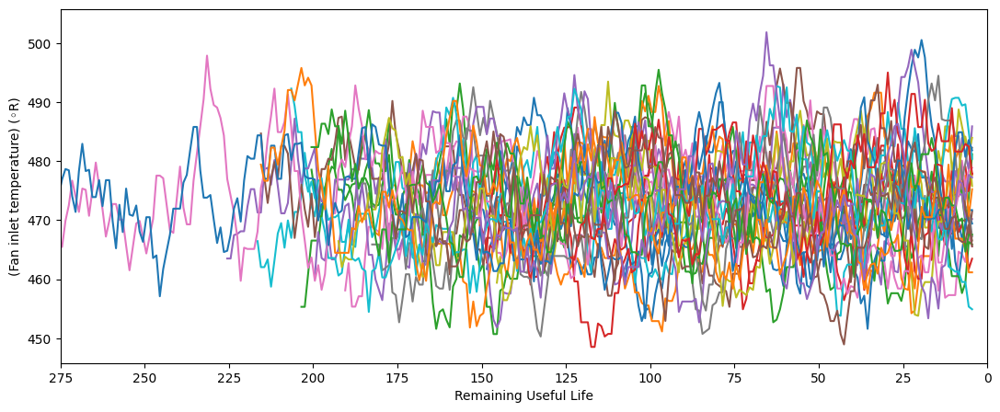

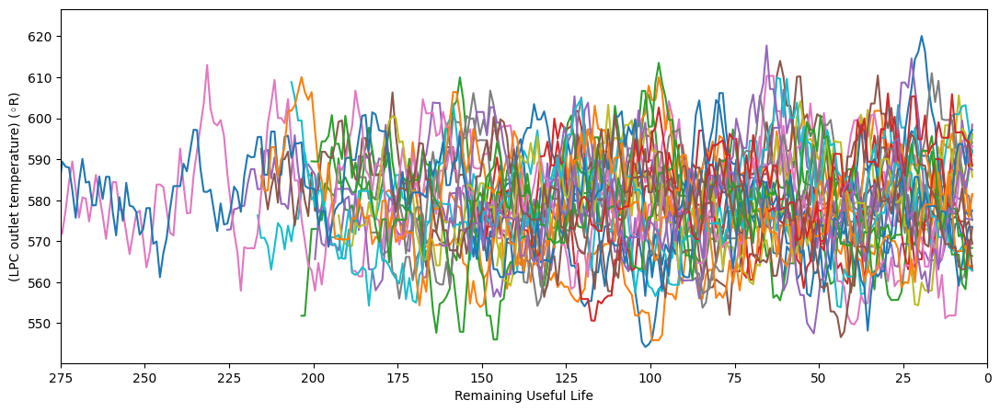

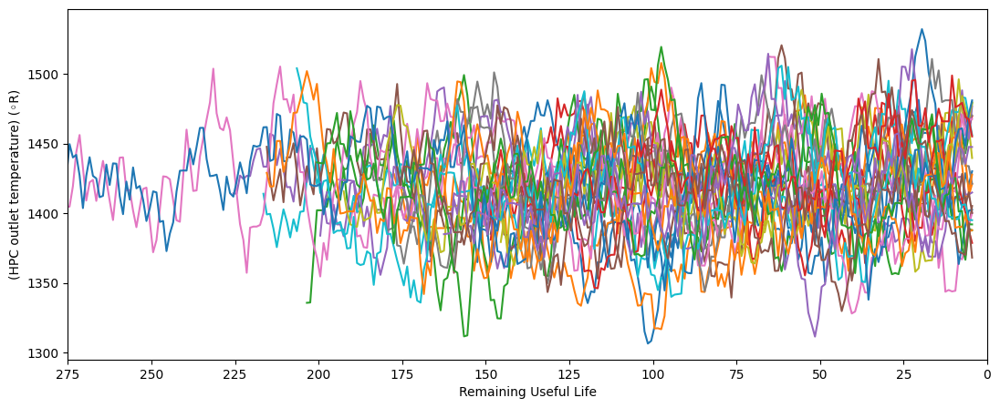

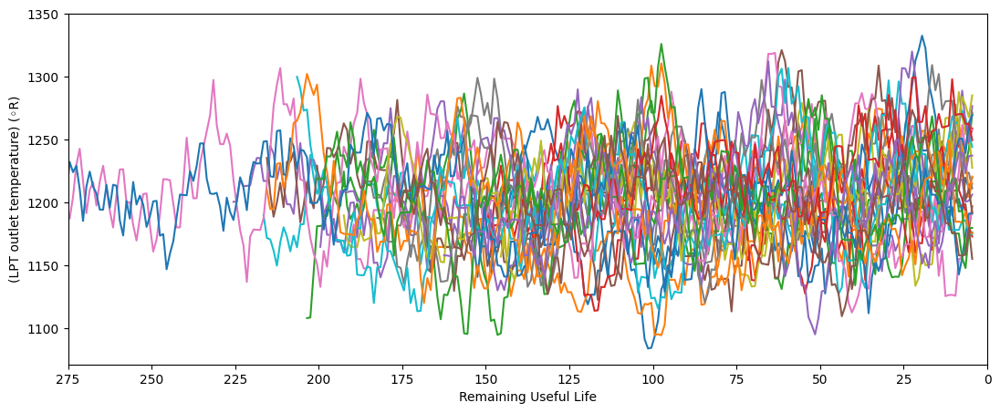

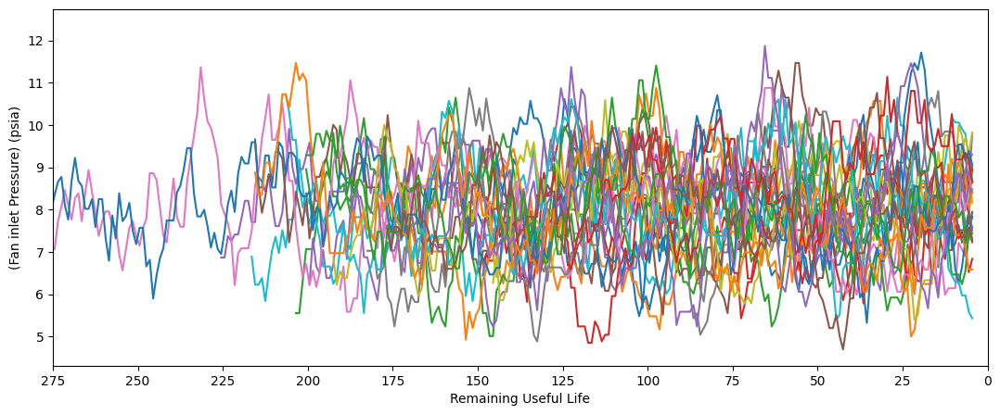

...

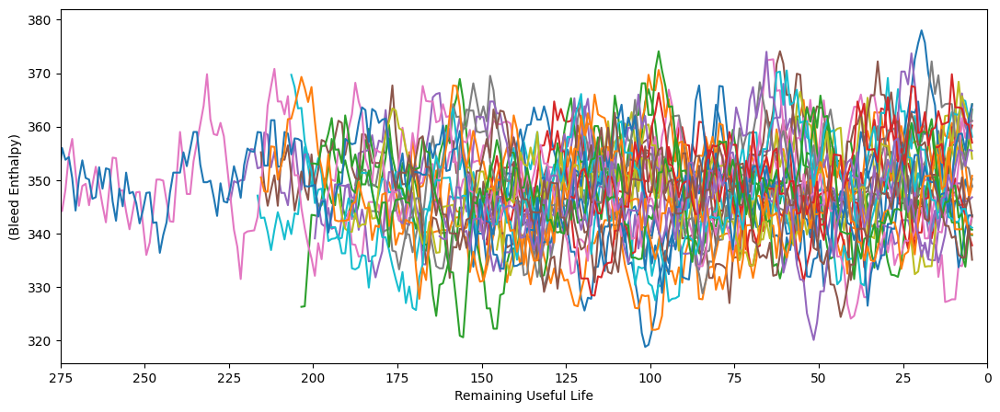

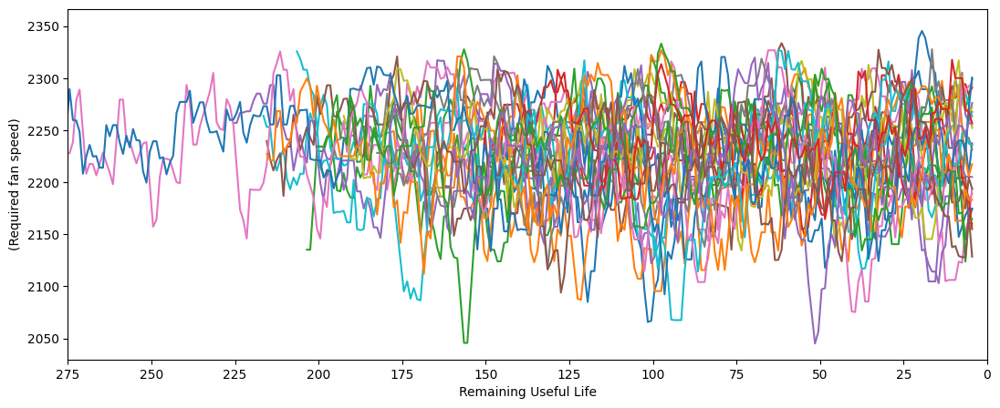

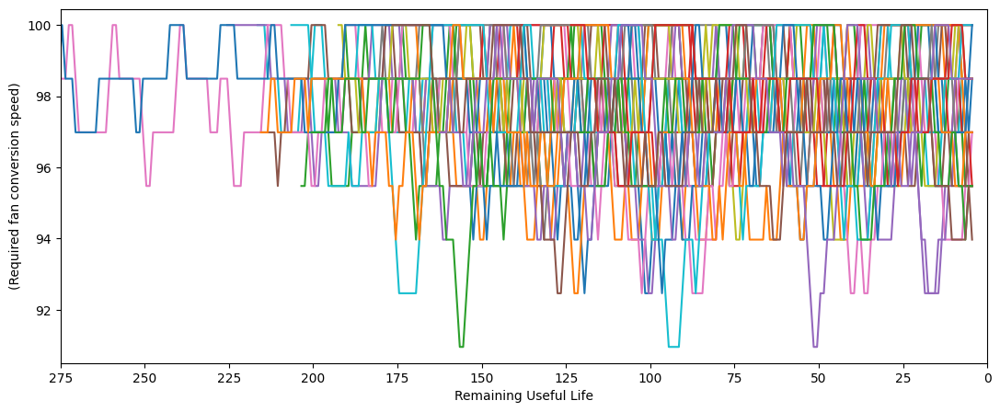

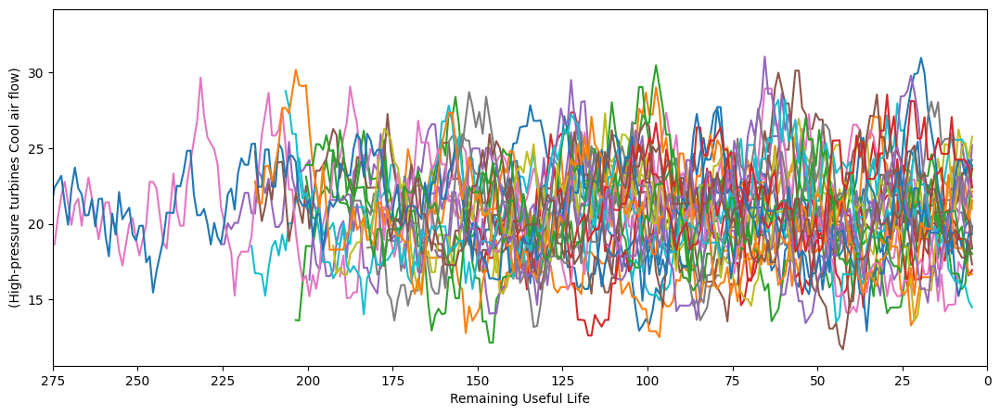

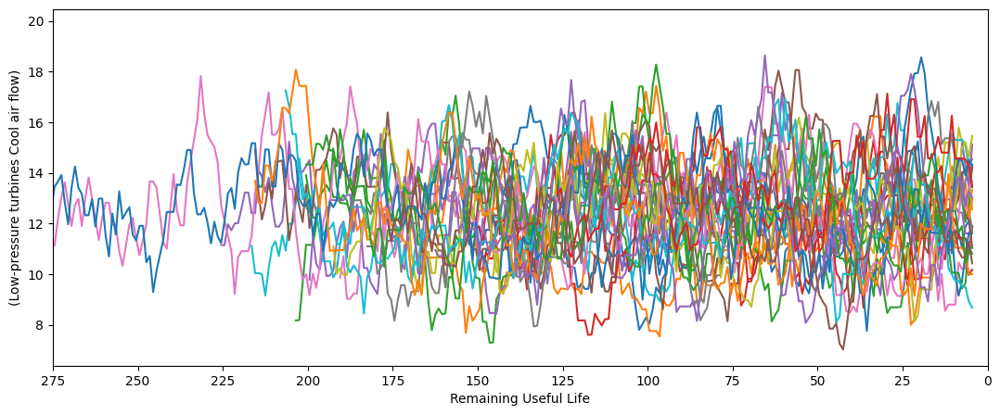

In [30]:
for i in range(1,22):
    try:
        plot_signal(train, Sensor_dictionary,'s_'+str(i))
    except:
        pass

In [31]:
train.loc[:,'s_1':].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
s_1,26858.0,472.869814,26.379637,445.0000,445.000000,462.5400,491.1900,518.6700
s_2,26858.0,579.525200,37.323571,535.6800,549.550000,555.9300,607.3100,644.3800
s_3,26858.0,1419.245994,106.117210,1245.8100,1352.430000,1368.6900,1498.9600,1610.8700
s_4,26858.0,1204.507670,119.174402,1030.0800,1123.060000,1138.3300,1306.1600,1439.2300
s_5,26858.0,8.024600,3.611394,3.9100,3.910000,7.0500,10.5200,14.6200
s_6,26858.0,11.586611,5.428751,5.7100,5.720000,9.0300,15.4900,21.6100
s_7,26858.0,282.139384,145.966229,136.8000,139.882500,194.6800,394.0900,555.8200
s_8,26858.0,2228.013180,145.921563,1914.7700,2211.890000,2223.0800,2323.9600,2388.3500
s_9,26858.0,8524.083668,336.476898,7985.5600,8321.840000,8361.5350,8778.2800,9215.6600
s_10,26858.0,1.094175,0.127348,0.9300,1.020000,1.0200,1.2600,1.3000


MinMax scaler function : Transform features by scaling each feature to a given range.

This estimater scales and translates each feature individually such that it is in the given range on the training set

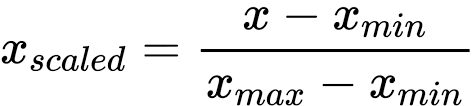

Dropping unnecessary features (labels and settings)

In [32]:
# 임시 코드
from sklearn.model_selection import train_test_split
drop_labels = index_names+setting_names

# index_name을 split해서 보관해뒀다가 추후에 병합해줘야 RL에 적용할 수 있음
X_train_index_names = train[['unit_number', 'time_cycles']]
X_train = train.drop(columns=drop_labels).copy()
X_train, X_test, y_train, y_test = train_test_split(X_train, X_train['RUL'], test_size = 0.01, random_state = 42, shuffle = False)

# Valid 코드도 수정해야 LR 가능함. ################################
# Valid data : engine 71~100
X_valid_index_names = valid[['unit_number','time_cycles']]
y_valid = valid[['RUL']]
X_valid = valid.drop(columns=drop_labels).copy()

X_full_index_names = full_data[['unit_number','time_cycles']]
y_full = full_data[['RUL']]
X_full = full_data.drop(columns=drop_labels).copy()

Test Code

In [33]:
print(y_train)
print(X_train)

0        148
1        147
2        146
3        145
4        144
        ... 
26584     91
26585     90
26586     89
26587     88
26588     87
Name: RUL, Length: 26589, dtype: int64
          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      449.44  555.32  1358.61  1137.23   5.48   8.00  194.64  2222.65   
1      445.00  549.90  1353.22  1125.78   3.91   5.71  138.51  2211.57   
2      462.54  537.31  1256.76  1047.45   7.05   9.02  175.71  1915.11   
3      445.00  549.51  1354.03  1126.38   3.91   5.71  138.46  2211.58   
4      462.54  537.07  1257.71  1047.93   7.05   9.03  175.05  1915.10   
...       ...     ...      ...      ...    ...    ...     ...      ...   
26584  489.05  604.31  1502.76  1309.12  10.52  15.49  394.67  2318.87   
26585  449.44  555.25  1367.13  1127.93   5.48   8.00  194.31  2223.08   
26586  491.19  607.20  1483.71  1248.22   9.35  13.66  334.54  2323.97   
26587  445.00  549.63  1347.59  1119.44   3.91   5.72  139.38  2212.03   
2658

In [34]:
print(y_valid)
print(X_valid)

       RUL
0      279
1      278
2      277
3      276
4      275
...    ...
26896    4
26897    3
26898    2
26899    1
26900    0

[26901 rows x 1 columns]
          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      445.00  548.77  1355.19  1124.01   3.91   5.71  138.37  2211.86   
1      445.00  549.12  1356.03  1118.15   3.91   5.71  138.39  2211.78   
2      518.67  642.63  1585.02  1395.48  14.62  21.61  553.79  2388.11   
3      518.67  641.90  1580.80  1399.71  14.62  21.61  554.79  2388.04   
4      491.19  607.07  1479.34  1242.09   9.35  13.65  334.80  2323.90   
...       ...     ...      ...      ...    ...    ...     ...      ...   
26896  491.19  608.79  1495.60  1269.51   9.35  13.66  334.00  2324.92   
26897  489.05  605.81  1514.32  1324.12  10.52  15.50  392.46  2319.17   
26898  462.54  537.48  1276.24  1057.92   7.05   9.04  175.11  1917.37   
26899  462.54  537.84  1272.95  1066.30   7.05   9.04  174.81  1917.36   
26900  449.44  556.64  1374.

Scaling the data

In [35]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()  # MinMaxScaler

#Droping the target variable (True RUL)
X_train.drop(columns=['RUL'], inplace=True) # inplace -> true면 원본 삭제 (current option)  # inplace -> False면 원본은 유지

#Scaling X_train
X_train_s=scaler.fit_transform(X_train)

#Conserve only the last occurence of each unit to match the length of y_valid
#X_valid = valid.groupby('unit_number').last().reset_index().drop(columns=drop_labels)

X_valid.drop(columns=['RUL'], inplace=True)
X_valid_s = scaler.transform(X_valid)

X_full.drop(columns=['RUL'], inplace=True)
X_full_s = scaler.transform(X_full)
#scaling X_valid
#X_valid_s=scaler.fit_transform(X_valid)

#fit_transform() : for train data ; transform() : for test data

In [36]:
print(X_train)

          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      449.44  555.32  1358.61  1137.23   5.48   8.00  194.64  2222.65   
1      445.00  549.90  1353.22  1125.78   3.91   5.71  138.51  2211.57   
2      462.54  537.31  1256.76  1047.45   7.05   9.02  175.71  1915.11   
3      445.00  549.51  1354.03  1126.38   3.91   5.71  138.46  2211.58   
4      462.54  537.07  1257.71  1047.93   7.05   9.03  175.05  1915.10   
...       ...     ...      ...      ...    ...    ...     ...      ...   
26584  489.05  604.31  1502.76  1309.12  10.52  15.49  394.67  2318.87   
26585  449.44  555.25  1367.13  1127.93   5.48   8.00  194.31  2223.08   
26586  491.19  607.20  1483.71  1248.22   9.35  13.66  334.54  2323.97   
26587  445.00  549.63  1347.59  1119.44   3.91   5.72  139.38  2212.03   
26588  491.19  607.36  1479.21  1249.23   9.35  13.66  334.76  2323.97   

           s_9  s_10  ...    s_12     s_13     s_14     s_15  s_16  s_17  \
0      8341.91  1.02  ...  183.06  

In [37]:
print(X_train_s)

[[0.06026877 0.18068077 0.3089903  ... 1.         0.15585307 0.15586487]
 [0.         0.13081877 0.29422561 ... 1.         0.00755235 0.01063793]
 [0.23808877 0.0149954  0.02999507 ... 0.         0.13353931 0.14815937]
 ...
 [0.6269852  0.65795768 0.6516737  ... 1.         0.48987298 0.49360924]
 [0.         0.12833487 0.27880348 ... 1.         0.0212839  0.01054647]
 [0.6269852  0.65942962 0.63934696 ... 1.         0.48781325 0.4966217 ]]


In [38]:
print(X_valid_s.shape)
print(y_valid.shape)
print(X_valid)
print(X_valid_s)

(26901, 21)
(26901, 1)
          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      445.00  548.77  1355.19  1124.01   3.91   5.71  138.37  2211.86   
1      445.00  549.12  1356.03  1118.15   3.91   5.71  138.39  2211.78   
2      518.67  642.63  1585.02  1395.48  14.62  21.61  553.79  2388.11   
3      518.67  641.90  1580.80  1399.71  14.62  21.61  554.79  2388.04   
4      491.19  607.07  1479.34  1242.09   9.35  13.65  334.80  2323.90   
...       ...     ...      ...      ...    ...    ...     ...      ...   
26896  491.19  608.79  1495.60  1269.51   9.35  13.66  334.00  2324.92   
26897  489.05  605.81  1514.32  1324.12  10.52  15.50  392.46  2319.17   
26898  462.54  537.48  1276.24  1057.92   7.05   9.04  175.11  1917.37   
26899  462.54  537.84  1272.95  1066.30   7.05   9.04  174.81  1917.36   
26900  449.44  556.64  1374.61  1145.52   5.48   8.01  194.33  2225.12   

           s_9  s_10  ...    s_12     s_13     s_14     s_15  s_16  s_17  \
0      8322.

In [39]:
print(y_valid)

       RUL
0      279
1      278
2      277
3      276
4      275
...    ...
26896    4
26897    3
26898    2
26899    1
26900    0

[26901 rows x 1 columns]


Plotting features new distribution

array([[<Axes: title={'center': 's_2'}>, <Axes: title={'center': 's_3'}>,
        <Axes: title={'center': 's_4'}>, <Axes: title={'center': 's_7'}>],
       [<Axes: title={'center': 's_8'}>, <Axes: title={'center': 's_9'}>,
        <Axes: title={'center': 's_11'}>,
        <Axes: title={'center': 's_12'}>],
       [<Axes: title={'center': 's_13'}>,
        <Axes: title={'center': 's_14'}>,
        <Axes: title={'center': 's_15'}>,
        <Axes: title={'center': 's_17'}>],
       [<Axes: title={'center': 's_20'}>,
        <Axes: title={'center': 's_21'}>, <Axes: >, <Axes: >]],
      dtype=object)

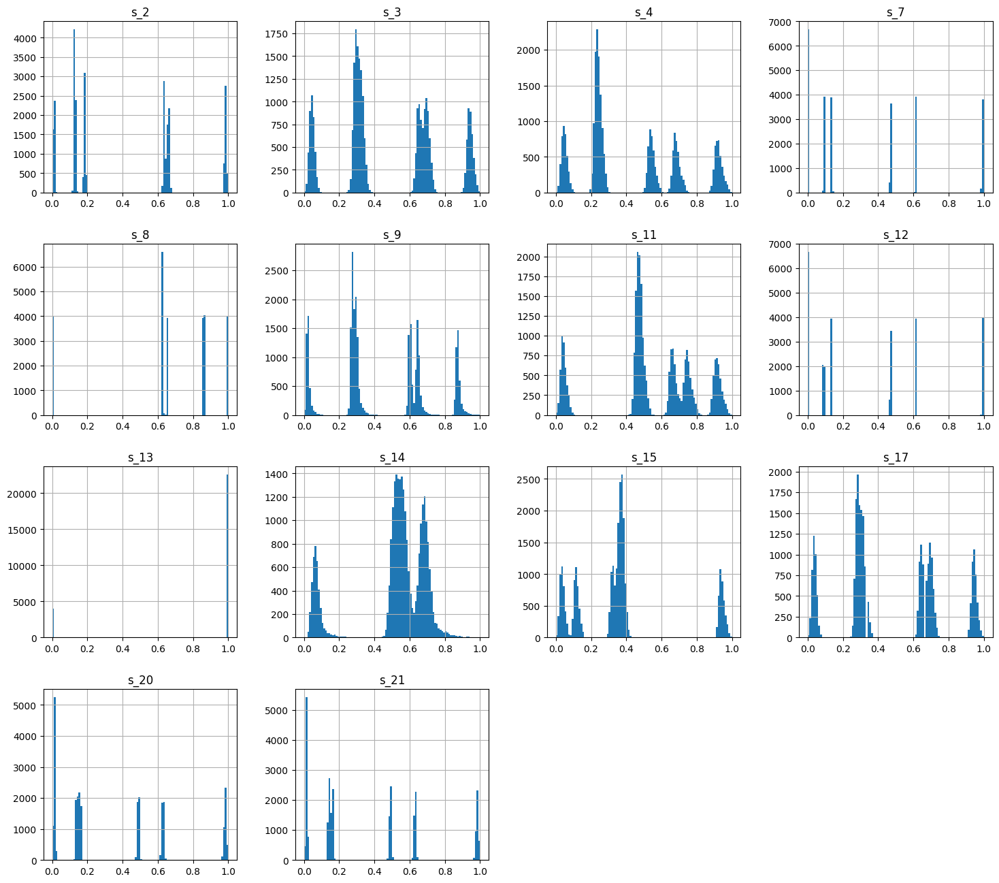

In [40]:
sensor_names=['s_{}'.format(i) for i in range(1,22) if i not in [1,5,6,10,16,18,19]]
pd.DataFrame(X_train_s,columns=['s_{}'.format(i) for i in range(1,22)])[sensor_names].hist(bins=100, figsize=(18,16))

# Model Implementation

Linear regression

In [41]:
"""
# 1. Original Linear Regression (gradient learning)
class Linear_Regression() :
    def __init__( self, lr=0.01, iterations=300 ) :
        self.lr = lr
        self.iterations = iterations
    def fit( self, X, Y ) :
        self.l, self.p = X.shape
        # weight initializer
        self.W = np.zeros( self.p ) # w : 0
        self.b = 0                  # b : 0
        self.X = X
        self.Y = Y
        # gradientlearning
        for i in range( self.iterations ) :
            self.weight_updater()
        return

    def weight_updater( self ) :
        Y_pred = self.predict( self.X )
        #  gradients
        dW = - ( 2 * ( self.X.T ).dot( self.Y - Y_pred )  ) / self.l
        db = - 2 * np.sum( self.Y - Y_pred ) / self.l
        # new weights assigned
        self.b = self.b - self.lr * db
        self.W = self.W - self.lr * dW
        return self

    def predict( self, X ) :
          # Y_pr=X.W+b
        return X.dot( self.W ) + self.b
"""

'\n# 1. Original Linear Regression (gradient learning)\nclass Linear_Regression() :\n    def __init__( self, lr=0.01, iterations=300 ) :\n        self.lr = lr\n        self.iterations = iterations\n    def fit( self, X, Y ) :\n        self.l, self.p = X.shape\n        # weight initializer\n        self.W = np.zeros( self.p ) # w : 0\n        self.b = 0                  # b : 0\n        self.X = X\n        self.Y = Y\n        # gradientlearning\n        for i in range( self.iterations ) :\n            self.weight_updater()\n        return\n\n    def weight_updater( self ) :\n        Y_pred = self.predict( self.X )\n        #  gradients\n        dW = - ( 2 * ( self.X.T ).dot( self.Y - Y_pred )  ) / self.l\n        db = - 2 * np.sum( self.Y - Y_pred ) / self.l\n        # new weights assigned\n        self.b = self.b - self.lr * db\n        self.W = self.W - self.lr * dW\n        return self\n\n    def predict( self, X ) :\n          # Y_pr=X.W+b\n        return X.dot( self.W ) + self.b\n'

Support Vector Regression (SVR)

In [42]:
from sklearn.svm import SVR
import tensorflow as tf
regressor = SVR(kernel='rbf')

Random forest

In [43]:
rf = RandomForestRegressor(max_features="sqrt", random_state=42)

Defining evaluation functions

In [44]:
# R2 score & RMSE & MSE
def evaluate(y_true, y_hat, label='test'):
    mse = mean_squared_error(y_true, y_hat)
    rmse = np.sqrt(mse)
    variance = r2_score(y_true, y_hat) # R2 score (R-squared) : indep. var.이 depend. var.을 얼마나 잘 설명하는가 (회귀모델 평가지표)
    print('{} set RMSE:{}, R2:{}'.format(label, rmse, variance))

In [45]:
# plot real data and the predicted one to make some comparison
def plot_predActual(y_test, y_test_hat):

    indices = np.arange(len(y_test_hat))
    wth= 0.6                                # width
    plt.figure(figsize=(70,30))
    true_values = [int(x) for x in y_test.values] # y : RUL
    predicted_values = list(y_test_hat)

    plt.bar(indices, true_values, width=wth,color='b', label='True RUL')
    plt.bar([i for i in indices], predicted_values, width=0.5*wth, color='r', alpha=0.7, label='Predicted RUL')

    plt.legend(prop={'size': 40})
    plt.tick_params(labelsize=40)

    plt.show()

**Use all feature**

In [46]:
print('maximum of y_train : ',y_train.max())
print('maximum of y_valid : ',y_valid.max())

maximum of y_train :  377
maximum of y_valid :  RUL    339
dtype: int64


In [47]:
print(X_train)

          s_1     s_2      s_3      s_4    s_5    s_6     s_7      s_8  \
0      449.44  555.32  1358.61  1137.23   5.48   8.00  194.64  2222.65   
1      445.00  549.90  1353.22  1125.78   3.91   5.71  138.51  2211.57   
2      462.54  537.31  1256.76  1047.45   7.05   9.02  175.71  1915.11   
3      445.00  549.51  1354.03  1126.38   3.91   5.71  138.46  2211.58   
4      462.54  537.07  1257.71  1047.93   7.05   9.03  175.05  1915.10   
...       ...     ...      ...      ...    ...    ...     ...      ...   
26584  489.05  604.31  1502.76  1309.12  10.52  15.49  394.67  2318.87   
26585  449.44  555.25  1367.13  1127.93   5.48   8.00  194.31  2223.08   
26586  491.19  607.20  1483.71  1248.22   9.35  13.66  334.54  2323.97   
26587  445.00  549.63  1347.59  1119.44   3.91   5.72  139.38  2212.03   
26588  491.19  607.36  1479.21  1249.23   9.35  13.66  334.76  2323.97   

           s_9  s_10  ...    s_12     s_13     s_14     s_15  s_16  s_17  \
0      8341.91  1.02  ...  183.06  

(array([4420., 4420., 4420., 4408., 3935., 2775., 1507.,  704.,  263.,
          49.]),
 array([  0. ,  33.9,  67.8, 101.7, 135.6, 169.5, 203.4, 237.3, 271.2,
        305.1, 339. ]),
 <BarContainer object of 10 artists>)

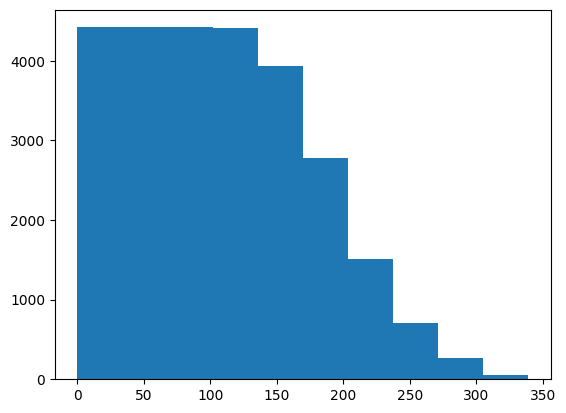

In [48]:
plt.hist(y_valid)

In [49]:
"""
drop_labels1=['s_1','s_2','s_5','s_6','s_8','s_9','s_10','s_11',
              's_13','s_14','s_15','s_16','s_17','s_18','s_19','s_20','s_21']
# drop -> axis : {0 or 'index', 1 or 'columns'}, default 0;
#         columns : axis (labels, axis = 1 is equivalent to index = labels)

# Drop labels
X_train_1=X_train.drop(columns=drop_labels1, axis=1) # drop the constant columns from the train dataset (because, axis = 1)
X_train_1_s=scaler.fit_transform(X_train_1) #scaling X_train_1

y_train_clip=y_train.clip(upper=195)  #Clipping y_train to have 195 as the maximum value (it means y = 197 -> y = 195)

X_valid_1=X_valid.drop(columns=drop_labels1, axis=1)  # drop the constant columns from the validation dataset
X_valid_1_s=scaler.fit_transform(X_valid_1) #scaling X_valid_1
"""

"\ndrop_labels1=['s_1','s_2','s_5','s_6','s_8','s_9','s_10','s_11',\n              's_13','s_14','s_15','s_16','s_17','s_18','s_19','s_20','s_21']\n# drop -> axis : {0 or 'index', 1 or 'columns'}, default 0;\n#         columns : axis (labels, axis = 1 is equivalent to index = labels)\n\n# Drop labels\nX_train_1=X_train.drop(columns=drop_labels1, axis=1) # drop the constant columns from the train dataset (because, axis = 1)\nX_train_1_s=scaler.fit_transform(X_train_1) #scaling X_train_1\n\ny_train_clip=y_train.clip(upper=195)  #Clipping y_train to have 195 as the maximum value (it means y = 197 -> y = 195)\n\nX_valid_1=X_valid.drop(columns=drop_labels1, axis=1)  # drop the constant columns from the validation dataset\nX_valid_1_s=scaler.fit_transform(X_valid_1) #scaling X_valid_1\n"

In [50]:
X_train_1=X_train
X_train_1_s=scaler.fit_transform(X_train_1) #scaling X_train_1

y_train_clip=y_train.clip(upper=195)  #Clipping y_train to have 195 as the maximum value (it means y = 197 -> y = 195)

X_valid_1=X_valid
X_valid_1_s=scaler.fit_transform(X_valid_1) #scaling X_valid_1

X_full_1=X_full
X_full_1_s=scaler.fit_transform(X_full_1) #scaling X_full_1


**Linear regression**

In [51]:
print(X_train_1_s)
print(X_train_1_s.shape)
print(X_valid_1_s)
print(X_valid_1_s.shape)
print(X_full_1_s)
print(X_full_1_s.shape)

[[0.06026877 0.18068077 0.3089903  ... 1.         0.15585307 0.15586487]
 [0.         0.13081877 0.29422561 ... 1.         0.00755235 0.01063793]
 [0.23808877 0.0149954  0.02999507 ... 0.         0.13353931 0.14815937]
 ...
 [0.6269852  0.65795768 0.6516737  ... 1.         0.48987298 0.49360924]
 [0.         0.12833487 0.27880348 ... 1.         0.0212839  0.01054647]
 [0.6269852  0.65942962 0.63934696 ... 1.         0.48781325 0.4966217 ]]
(26589, 21)
[[0.         0.12147903 0.30193688 ... 1.         0.01097394 0.02033038]
 [0.         0.12469034 0.30421238 ... 1.         0.01406036 0.02360691]
 [1.         0.98265896 0.92452932 ... 1.         0.98868313 0.99006803]
 ...
 [0.23808877 0.01789155 0.08806718 ... 0.         0.13751715 0.14447428]
 [0.23808877 0.02119461 0.07915482 ... 0.         0.13271605 0.13438303]
 [0.06026877 0.19368749 0.35454422 ... 1.         0.15672154 0.16121527]]
(26901, 21)
[[0.06026877 0.18157629 0.31120141 ... 1.         0.15603567 0.15908212]
 [0.         0.

In [52]:
print(y_train_clip)
print(y_train_clip.shape)

0        148
1        147
2        146
3        145
4        144
        ... 
26584     91
26585     90
26586     89
26587     88
26588     87
Name: RUL, Length: 26589, dtype: int64
(26589,)


# **Loss function Tuning**

**1. Original MSE**

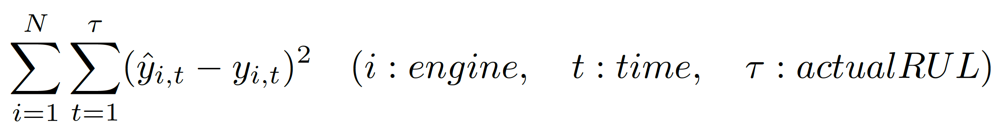

In [53]:
# 1. Original Linear Regression (모든 데이터 사용)
lr1 = LinearRegression()

lr1.fit(X_train_1_s, y_train_clip) #Fitting

y_lr_train_1 = lr1.predict(X_train_1_s) #Prediction on train data
evaluate(y_train_clip, y_lr_train_1, label='train')

y_lr_valid_1 = lr1.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_1, label='valid')

y_lr_full_1 = lr1.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_1, label='full data')

print(lr1.coef_)

train set RMSE:36.53948896518721, R2:0.6357459518938806
valid set RMSE:50.51909245994386, R2:0.44894398860916285
full data set RMSE:47.06877390067294, R2:0.53708037219357
[ 8.32601196e+03 -1.15459814e+03 -2.33384770e+02 -4.31710910e+02
  8.65952214e+03 -1.18880409e+04  1.15074555e+03  2.72521569e+03
 -5.16256009e+02  1.60521604e+02 -7.12443914e+02  1.17144850e+03
 -2.61276300e+03 -4.34022802e+01 -7.55665877e+02  6.12578661e-01
 -2.95739743e+02 -1.90112106e+04  1.54925359e+04  3.36829061e+02
  2.14456800e+02]


**2. Crucial moments Loss function**

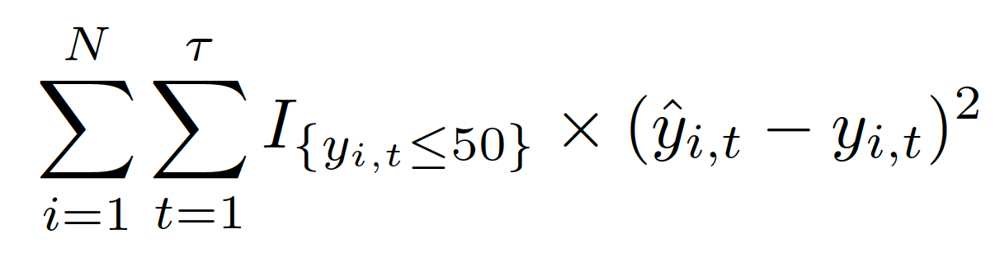

In [54]:
# 2. Crucial moments loss function - Linear Regression

# Filter and save only data that is less than 50.
filtered_data = X_train_1_s[y_train_clip <= 50]
filtered_labels = y_train_clip[y_train_clip <= 50]

lr2 = LinearRegression()

lr2.fit(filtered_data, filtered_labels) #Fitting

y_lr_train_2 = lr2.predict(X_train_1_s) #Prediction on train data
evaluate(y_train_clip, y_lr_train_2, label='train')

y_lr_valid_2 = lr2.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_2, label='valid')

y_lr_full_2 = lr2.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_2, label='full data')

print(lr2.coef_)

train set RMSE:74.43969366910439, R2:-0.5117800269828601
valid set RMSE:87.5990241142594, R2:-0.6568500303925697
full data set RMSE:85.83689175249094, R2:-0.5395287028240379
[ 2.22441324e+02 -3.90673813e+02 -8.15435236e+01 -1.59425084e+02
 -1.53968283e+03 -1.33519510e+02  6.83204564e+02 -2.06818664e+02
 -1.00261362e+02 -5.46378978e+01 -2.80386690e+02  6.52647692e+02
 -1.73752730e+02  2.59693661e+00 -2.35709612e+02  3.18145254e-01
 -1.00847620e+02  1.66233768e+03 -8.64849520e+02  1.33763155e+02
  1.74065329e+02]


**3. TD Style Loss function (ridge regression)**

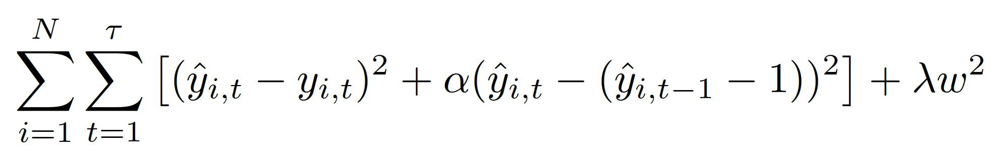

In [55]:
# Multi var linear regression

class Linear_Regression_TD() :
  def __init__( self, alpha=0, lambda_ridge=0 ) :
    self.alpha = alpha
    self.lambda_ridge = lambda_ridge  # Ridge regression

  def fit(self, X, Y, alpha, lambd) :
    self.l, self.p = X.shape
    self.alpha = alpha
    self.lambda_ridge = lambd
    # weight initializer
    self.p = (self.p + 1)         # add constant term.

    self.add_X = np.ones(self.l)
    self.X = np.c_[self.add_X, X]

    self.array_Y = np.array(Y[0:].to_numpy())
    self.array_Y.reshape( self.l, 1 )
    self.Y = self.array_Y
    self.W = np.zeros( self.p ) # W : 0 (b is included)

    self.identity = np.identity( n = self.p ) # Ridge regression
    self.lambda_identity = self.lambda_ridge * self.identity   # lambda * I

    # 각각의 행렬 연산
    X_T_X = (self.X.T) @ (self.X)          # X^(T)X
    X_diff_T_X_diff_sum = np.zeros( [self.p, self.p] )

    for i in range(1, self.l):
      X_diff_T_X_diff = (( self.X[i, :] - self.X[i - 1, :] ).reshape(self.p, 1)) @ (( self.X[i, :] - self.X[i - 1, :] ).reshape(1, self.p))
      X_diff_T_X_diff_sum += X_diff_T_X_diff


    X_T_Y = (self.X.T) @ (self.Y)
    X_T_Y = X_T_Y.reshape( self.p, 1 )
    X_diff_T_sum = np.zeros( [self.p, 1] )

    for i in range(1, self.l):
      X_diff_T = (( self.X[i, :] - self.X[i - 1, :] ).reshape( self.p, 1 ))
      X_diff_T_sum += X_diff_T

    self.W = np.linalg.inv(X_T_X + (self.alpha * X_diff_T_X_diff_sum) + self.lambda_identity) @ (X_T_Y - self.alpha * X_diff_T_sum)

    print(self.W)
    print(self.W.shape)

# X를 입력 받으면 첫 열에 1의 값을 갖는 열을 추가해서 계산해야함. (입력으로 들어오는 X는 (n, 21)이니 (n, 22)로 바꿔줘야 함)
  def predict( self, X) :
    l_X, p_X = X.shape
    p_X = p_X + 1
    add_col = np.ones(l_X)

    X = np.c_[add_col, X]

    return X.dot( self.W )

In [56]:
lr3 = Linear_Regression_TD()

# fit(X, Y, alpha, lambda)        # lambda = 10
lr3.fit(X_train_1_s, y_train_clip, 0.5, 10) #Fitting

y_lr_train_3 = lr3.predict(X_train_1_s) #Prediction on train data
evaluate(y_train_clip, y_lr_train_3, label='train')

y_lr_valid_3 = lr3.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_3, label='valid')

y_lr_full_3 = lr3.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_3, label='full data')

[[ 475.85852432]
 [ 432.57053035]
 [  89.14438591]
 [-252.16454713]
 [-316.9030557 ]
 [ -64.83884223]
 [ -57.03118409]
 [  75.4036565 ]
 [ 103.49003985]
 [ -40.33128909]
 [ 175.01634335]
 [-353.63046996]
 [  73.16289997]
 [  24.23688982]
 [-120.08764407]
 [-410.48480252]
 [ -26.60105232]
 [-266.9872232 ]
 [ 112.5140164 ]
 [  40.72163491]
 [ -53.91020997]
 [ -58.9520363 ]]
(22, 1)
train set RMSE:43.94421503485239, R2:0.47315498983604387
valid set RMSE:54.4791773579985, R2:0.3591657039253353
full data set RMSE:54.39731128746722, R2:0.3817064830526222


**4. TD Style Loss function + Crucial moments (ridge regression)**

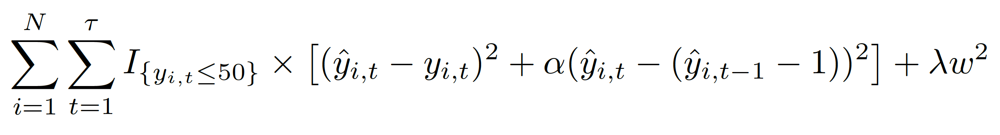

In [57]:
filtered_data_2 = X_train_1_s[y_train_clip <= 50]
filtered_labels_2 = y_train_clip[y_train_clip <= 50]

lr4 = Linear_Regression_TD()

# fit(X, Y, alpha, lambda)        # lambda = 10
lr4.fit(filtered_data_2, filtered_labels_2, 0.5, 10) #Fitting

y_lr_train_4 = lr4.predict(X_train_1_s)
evaluate(y_train_clip, y_lr_train_4, label='train')

y_lr_valid_4 = lr4.predict(X_valid_1_s) #Prediction on validation data
evaluate(y_valid, y_lr_valid_4, label='valid')

y_lr_full_4 = lr4.predict(X_full_1_s) #Prediction on full data
evaluate(y_full, y_lr_full_4, label='full data')


[[ 47.52948208]
 [ 39.18257848]
 [ 10.93805846]
 [-24.90698007]
 [-40.96600935]
 [ -0.94649892]
 [ -3.19156548]
 [  0.39590974]
 [ 15.7845456 ]
 [ -0.36656279]
 [ 26.94080742]
 [-47.92610015]
 [  0.10021888]
 [  8.2149924 ]
 [-16.62401669]
 [-23.58045722]
 [ -5.75395179]
 [-26.66288419]
 [ 16.56127918]
 [  9.3675224 ]
 [  3.32529647]
 [  3.79386422]]
(22, 1)
train set RMSE:94.91263656938656, R2:-1.4576923878852441
valid set RMSE:103.85425502457907, R2:-1.3288056903916252
full data set RMSE:104.21542722810081, R2:-1.269362378326739


Merge!

In [58]:
# loss function 별 dataframe들을 list로 저장
y_lr_valid_dfs = [pd.DataFrame(y_lr_valid_1, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_valid_2, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_valid_3, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_valid_4, columns=['predicted RUL'])]
merged_valid_dfs = []

# 각 dataframe에 병합하고 출력
for i, y_lr_valid_df in enumerate(y_lr_valid_dfs, start=1):
    merged_valid = pd.concat([X_valid_index_names, y_lr_valid_df, y_valid], axis=1)
    merged_valid_dfs.append(merged_valid)
    print(f"Merged Valid DataFrame {i}:\n", merged_valid)

Merged Valid DataFrame 1:
        unit_number  time_cycles  predicted RUL  RUL
0              131            1     141.468615  279
1              131            2     149.682217  278
2              131            3     132.539127  277
3              131            4     149.570698  276
4              131            5     145.550620  275
...            ...          ...            ...  ...
26896          260          312     -76.686375    4
26897          260          313    -107.234278    3
26898          260          314     -73.899029    2
26899          260          315     -96.993451    1
26900          260          316     -83.661238    0

[26901 rows x 4 columns]
Merged Valid DataFrame 2:
        unit_number  time_cycles  predicted RUL  RUL
0              131            1      57.782019  279
1              131            2      61.120423  278
2              131            3      64.191130  277
3              131            4      70.779387  276
4              131            5     

In [59]:
# loss function 별 dataframe들을 list로 저장
y_lr_full_dfs = [pd.DataFrame(y_lr_full_1, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_full_2, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_full_3, columns=['predicted RUL']),
                  pd.DataFrame(y_lr_full_4, columns=['predicted RUL'])]
merged_full_dfs = []

# 각 dataframe에 병합하고 출력
for i, y_lr_full_df in enumerate(y_lr_full_dfs, start=1):
    merged_full = pd.concat([X_full_index_names, y_lr_full_df, y_full], axis=1)
    merged_full_dfs.append(merged_full)
    print(f"Merged full DataFrame {i}:\n", merged_full)

Merged full DataFrame 1:
        unit_number  time_cycles  predicted RUL  RUL
0                1            1      99.588215  148
1                1            2     107.312577  147
2                1            3     110.508551  146
3                1            4     140.230044  145
4                1            5      93.513995  144
...            ...          ...            ...  ...
53754          260          312     -59.795084    4
53755          260          313     -88.593612    3
53756          260          314     -71.331855    2
53757          260          315     -94.324134    1
53758          260          316     -72.074845    0

[53759 rows x 4 columns]
Merged full DataFrame 2:
        unit_number  time_cycles  predicted RUL  RUL
0                1            1      42.689039  148
1                1            2      42.436508  147
2                1            3      44.827618  146
3                1            4      55.332536  145
4                1            5      3

# Visualization

**(1) 각 엔진의 online predict value (test data 71~100)**

(X-axis : Time cycles, Y-axis : predicted RUL)

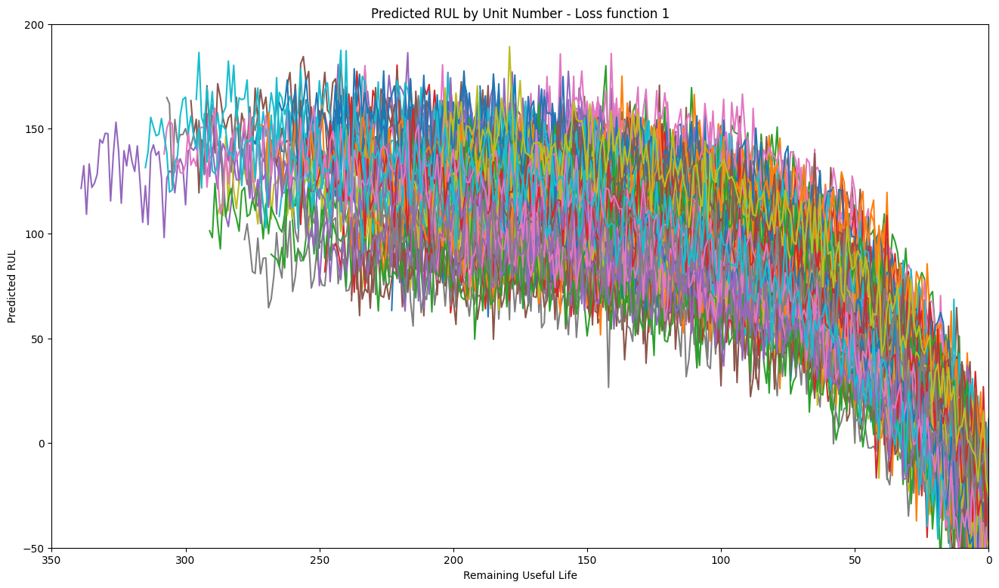

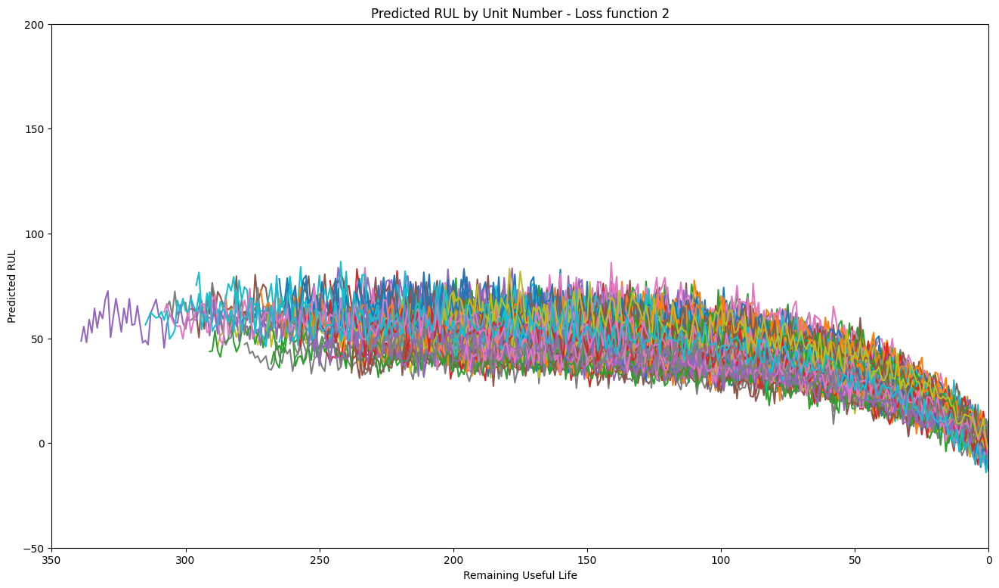

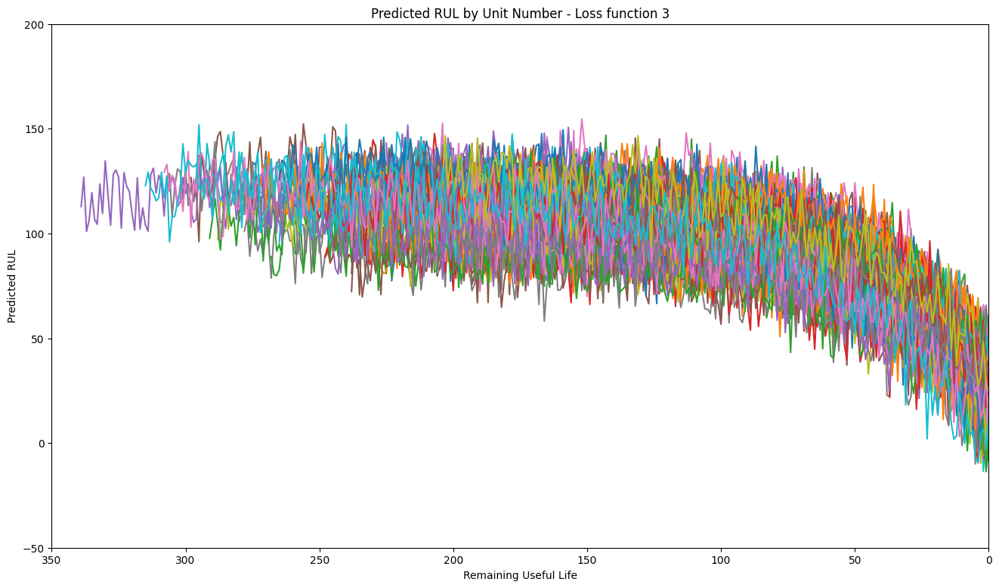

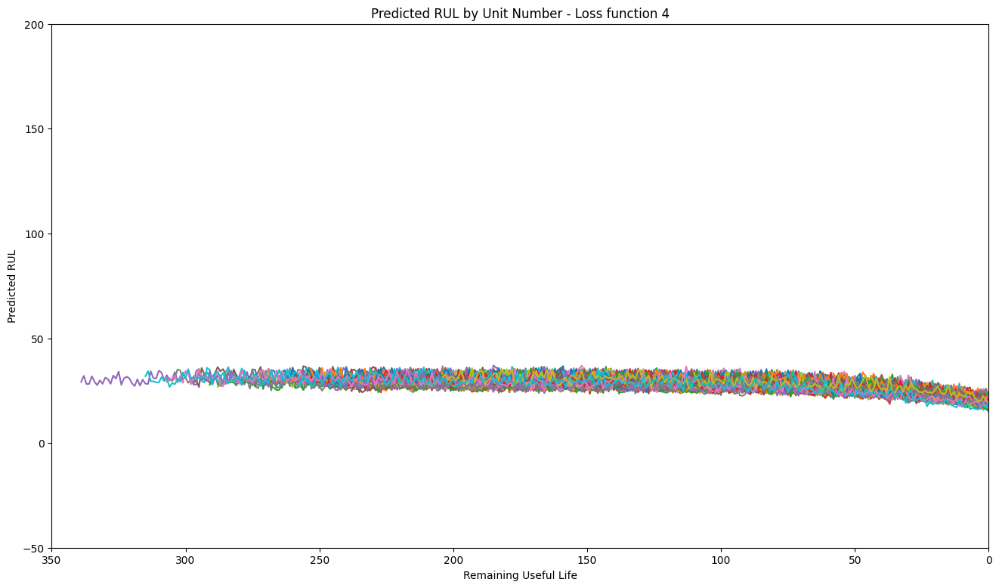

In [60]:
# merged_valid_dfs 리스트에 있는 데이터프레임들에 대해 반복 수행
for i, merged_valid_df in enumerate(merged_valid_dfs, start=1):
    # 데이터프레임에서 unit_number을 기준으로 그룹화
    grouped = merged_valid_df.groupby('unit_number')

    # 그래프를 그릴 subplot을 설정
    fig, ax = plt.subplots(figsize=(16, 9))

    # unit_number 별로 그래프 그리기
    for unit, group in grouped:
        ax.plot(group['RUL'], group['predicted RUL'], label=f'Unit {unit}')

    ax.set_xlabel('Remaining Useful Life')
    ax.set_ylabel('Predicted RUL')
    ax.set_title(f'Predicted RUL by Unit Number - Loss function {i}')
    #ax.legend(loc='upper right')  # 범례 추가

    # 그래프 출력 설정
    plt.xlim(350, 0)  # reverse the x-axis so RUL counts down to zero
    plt.ylim(-50, 200)
    plt.show()

**Threshold, Actual Operation Time**

**Add "Cumulative Operation Time", "Total Cost" Columns**


Cost : Failure (10,000), replace (1000)

In [61]:
# define list of threshold_value
threshold_start = -40        # -40
threshold_end = 90           # 90
threshold_values = list(range(threshold_start, threshold_end + 1))

# 각 threshold_value에 대한 dataframe을 담을 리스트를 생성.
by_threshold_dfs_list = []

# Define cost (Tentative Value)
REPLACE_COST = 1000       # replace cost를 크게 늘려도, 반등하는 최저점을 찾을 수 없음 <- Total cost로 해서 상수가 나왔었음. 시간당 cost로 환산하면 커브 그려짐.
FAILURE_COST = 10000

# merged_valid_dfs 리스트 내에 있는 각 데이터프레임에 대해 반복 수행

for merged_valid_df in merged_valid_dfs:
    by_threshold_dfs = []

    # threshold_value 별 처리.
    for threshold_value in threshold_values:

        cumulative_operation_time = 0
        total_cost = 0
        average_cost = 0             # total cost / operation time
        by_threshold_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])

        grouped = merged_valid_df.groupby('unit_number')

        for unit, group in grouped:
            operation_time = None

            max_RUL = group['RUL'].max()

            for index, row in group.iterrows():
                if row['predicted RUL'] <= threshold_value:   # 'predicted RUL'이 threshold보다 작거나 같으면 replace! (이후 for문 탈출)
                    operation_time = row['time_cycles']
                    cumulative_operation_time += operation_time
                    total_cost += REPLACE_COST
                    break


            if pd.isna(operation_time):
                cumulative_operation_time += max_RUL
                total_cost += FAILURE_COST

            average_cost = total_cost / cumulative_operation_time  # calculate average cost
            by_threshold_df = by_threshold_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                      'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                      'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

        by_threshold_dfs.append(by_threshold_df)

    by_threshold_dfs_list.append(by_threshold_dfs)

**Apply full data set**

In [62]:
# 각 threshold_value에 대한 dataframe을 담을 리스트를 생성.
full_by_threshold_dfs_list = []

# merged_full_dfs 리스트 내에 있는 각 데이터프레임에 대해 반복 수행
for merged_full_df in merged_full_dfs:
    full_by_threshold_dfs = []

    # threshold_value 별 처리.
    for threshold_value in threshold_values:

        cumulative_operation_time = 0
        total_cost = 0
        average_cost = 0             # total cost / operation time
        full_by_threshold_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])

        grouped = merged_full_df.groupby('unit_number')

        for unit, group in grouped:
            operation_time = None

            max_RUL = group['RUL'].max()

            for index, row in group.iterrows():
                if row['predicted RUL'] <= threshold_value:
                    operation_time = row['time_cycles']
                    cumulative_operation_time += operation_time
                    total_cost += REPLACE_COST
                    break

            if pd.isna(operation_time):
                cumulative_operation_time += max_RUL
                total_cost += FAILURE_COST

            average_cost = total_cost / cumulative_operation_time  # calculate average cost
            full_by_threshold_df = full_by_threshold_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                      'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                      'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

        full_by_threshold_dfs.append(full_by_threshold_df)

    full_by_threshold_dfs_list.append(full_by_threshold_dfs)
#print(full_by_threshold_dfs_list[1][1])

In [63]:
#print(full_by_threshold_dfs_list[1][1])
#print(full_by_threshold_dfs_list[2][1])

**(2) Threshold를 x축으로 두고 분석**

(x-axis : Threshold, y-axis : Number of replace failures)


(x-axis : Threshold, y-axis : Total Cost)

In [64]:
# Total time을 고정하는 것이 아닌, 사용한 엔진 수를 고정해 비교. (23.09.09)

# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.
# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.
nan_counts_list = []
average_cost_list_list = []
average_usage_time_list_list = []

# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행
for by_threshold_dfs in by_threshold_dfs_list:
    nan_counts = []
    average_cost_list = []
    average_usage_time_list = []

    # 각 dataframe마다 수행.
    for df in by_threshold_dfs:

        average_usage_time = df['Cumulative Operation Time'].iloc[-1] / (len(df.index) + 1)  # 전체 엔진에 대한 평균 사용 시간 저장.
        average_usage_time_list.append(average_usage_time)                                   # 결과를 리스트에 다시 저장.


        average_cost_by_threshold = df['Average Cost'].iloc[-1]                                  # 'Average Cost'의 열에서 마지막 값을 가져옴.
        average_cost_list.append(average_cost_by_threshold)                                      # 'Average Cost'를 list에 저장

        # 'actual operation time' column의 NaN 개수 count 후 리스트에 추가. index의 끝까지 Nan을 count.
        nan_count = df.loc[:, 'actual operation time'].isna().sum()
        nan_counts.append(nan_count)

    nan_counts_list.append(nan_counts)
    average_cost_list_list.append(average_cost_list)
    average_usage_time_list_list.append(average_usage_time_list)

# 각 by_threshold_dfs 리스트 내에 대한 결과를 저장하는 데이터프레임 생성
nan_counts_and_cost_df_list = []
for i, by_threshold_dfs in enumerate(by_threshold_dfs_list, start=1):
    threshold_values = list(range(threshold_start, threshold_end + 1))
    nan_counts_and_cost_df = pd.DataFrame({'Threshold': threshold_values, 'Number of replace failures': nan_counts_list[i - 1],
                                           'Average Cost': average_cost_list_list[i - 1], 'Average usage time' : average_usage_time_list_list[i - 1]})
    nan_counts_and_cost_df_list.append(nan_counts_and_cost_df)
    print(f"DataFrame for merged_valid_df {i}:\n", nan_counts_and_cost_df)

DataFrame for merged_valid_df 1:
      Threshold  Number of replace failures  Average Cost  Average usage time
0          -40                          39     18.346874          200.129771
1          -39                          35     16.996410          199.862595
2          -38                          34     16.662845          199.740458
3          -37                          33     16.338869          199.496183
4          -36                          32     16.017781          199.206107
..         ...                         ...           ...                 ...
126         86                           0     13.615417           72.885496
127         87                           0     13.865188           71.572519
128         88                           0     14.105903           70.351145
129         89                           0     14.372582           69.045802
130         90                           0     14.904838           66.580153

[131 rows x 4 columns]
DataFrame for merg

**apply full data**

In [65]:
# Total time을 고정하는 것이 아닌, 사용한 엔진 수를 고정해 비교. (23.09.09)

# empty list를 생성, threshold와 count of NaN을 저장할 list 초기화.
# 정해진 operation time까지의 Total Cost를 저장할 list 초기화.
full_nan_counts_list = []
full_average_cost_list_list = []
full_average_usage_time_list_list = []

# 각 by_threshold_dfs 리스트 내의 by_threshold_df에 대해 반복 수행
for full_by_threshold_dfs in full_by_threshold_dfs_list:
    full_nan_counts = []
    full_average_cost_list = []
    full_average_usage_time_list = []

    # 각 dataframe마다 수행.
    for df in full_by_threshold_dfs:

        full_average_usage_time = df['Cumulative Operation Time'].iloc[-1] / (len(df.index) + 1)  # 전체 엔진에 대한 평균 사용 시간 저장.
        full_average_usage_time_list.append(full_average_usage_time)                                   # 결과를 리스트에 다시 저장.


        full_average_cost_by_threshold = df['Average Cost'].iloc[-1]                            # 'Average Cost'의 열에서 마지막 값을 가져옴.
        full_average_cost_list.append(full_average_cost_by_threshold)                           # 'Aberage cost'를 list에 저장

        # 'actual operation time' column의 NaN 개수 count 후 리스트에 추가. index의 끝까지 Nan을 count.
        full_nan_count = df.loc[:, 'actual operation time'].isna().sum()
        full_nan_counts.append(full_nan_count)

    full_nan_counts_list.append(full_nan_counts)
    full_average_cost_list_list.append(full_average_cost_list)
    full_average_usage_time_list_list.append(full_average_usage_time_list)

# 각 by_threshold_dfs 리스트 내에 대한 결과를 저장하는 데이터프레임 생성
full_nan_counts_and_cost_df_list = []
for i, full_by_threshold_dfs in enumerate(full_by_threshold_dfs_list, start=1):
    threshold_values = list(range(threshold_start, threshold_end + 1))
    full_nan_counts_and_cost_df = pd.DataFrame({'Threshold': threshold_values, 'Number of replace failures': full_nan_counts_list[i - 1],
                                           'Total Cost': full_average_cost_list_list[i - 1], 'Average usage time' : full_average_usage_time_list_list[i - 1]})
    full_nan_counts_and_cost_df_list.append(full_nan_counts_and_cost_df)
    print(f"DataFrame for merged_valid_df {i}:\n", full_nan_counts_and_cost_df)

DataFrame for merged_valid_df 1:
      Threshold  Number of replace failures  Total Cost  Average usage time
0          -40                         164   32.663506          203.632184
1          -39                         159   31.829989          203.547893
2          -38                         155   31.169369          203.436782
3          -37                         152   30.671841          203.363985
4          -36                         149   30.185335          203.214559
..         ...                         ...         ...                 ...
126         86                           0    9.925558          100.363985
127         87                           0   10.082209           98.804598
128         88                           0   10.268157           97.015326
129         89                           0   10.534419           94.563218
130         90                           0   10.905125           91.348659

[131 rows x 4 columns]
DataFrame for merged_valid_df 2:
      Thr

**Scatter plot - Threshold에 따른 replace 실패 횟수와, 총 사용한 엔진수**

In [ ]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:blue'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Number of replace failures', color=color)
    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5,80)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(10,140)

    # 그래프 제목 설정
    ax1.set_title(f'Number of Failures & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Number of failures)\n    color = 'tab:blue'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Number of replace failures', color=color)\n    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5,80)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.t

**Plot - Threshold에 따른 replace 실패 횟수와, 총 사용한 엔진 수**

In [ ]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:blue'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Number of replace failures', color=color)
    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5,80)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(10,140)

    # 그래프 제목 설정
    ax1.set_title(f'Number of Failures & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Number of failures)\n    color = 'tab:blue'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Number of replace failures', color=color)\n    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Number of replace failures'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5,80)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.tick_pa

**Scatter plot - Total Cost & Total Number of Engines Used**

In [ ]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:green'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Total Cost', color=color)
    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5000,250000)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(20,32)

    # 그래프 제목 설정
    ax1.set_title(f'Total Cost & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Number of failures)\n    color = 'tab:green'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Total Cost', color=color)\n    ax1.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5000,250000)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.tick_params(axis='y', lab

**Plot - Total Cost & Total Number of Engines Used**

In [ ]:
"""
fig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Total Cost)
    color = 'tab:green'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Total Cost', color=color)
    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax1.set_ylim(-5000,250000)

    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(20,32)

    # 그래프 제목 설정
    ax1.set_title(f'Total Cost & Total Number of Engines Used - Loss function {i}')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()
"""

"\nfig, axs = plt.subplots(len(nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(nan_counts_and_cost_df_list)))\n\n# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    ax1 = axs[i-1]\n\n    # 왼쪽 Y축 그래프 (Total Cost)\n    color = 'tab:green'\n    ax1.set_xlabel('Threshold')\n    ax1.set_ylabel('Total Cost', color=color)\n    ax1.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'], color=color)\n    ax1.tick_params(axis='y', labelcolor=color)\n    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시\n    ax1.set_ylim(-5000,250000)\n\n    # 오른쪽 Y축 그래프 (Total Number of Engines Used)\n    ax2 = ax1.twinx()\n    color = 'tab:red'\n    ax2.set_ylabel('Total Number of Engines Used', color=color)\n    ax2.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Last index'] + 1, color=color)\n    ax2.tick_params(axis='y', labelcolor=color)

**Scatter plot of Total Cost**

In [ ]:
"""
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    plt.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])
    plt.xlabel('Threshold')
    plt.ylabel('Total Cost')
    plt.title(f'Threshold vs Total Cost - Loss function {i}')
    plt.grid(True)
    plt.ylim(-5000, 1010000)
    plt.show()
"""

"\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    plt.scatter(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])\n    plt.xlabel('Threshold')\n    plt.ylabel('Total Cost')\n    plt.title(f'Threshold vs Total Cost - Loss function {i}')\n    plt.grid(True)\n    plt.ylim(-5000, 1010000)\n    plt.show()\n"

**Plot of Total Cost**

In [ ]:
"""
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):
    plt.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])
    plt.xlabel('Threshold')
    plt.ylabel('Total Cost')
    plt.title(f'Threshold vs Total Cost - Loss function {i}')
    plt.grid(True)
    plt.ylim(-100, 70000)
    plt.show()
"""

"\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list, start=1):\n    plt.plot(nan_counts_and_cost_df['Threshold'], nan_counts_and_cost_df['Total Cost'])\n    plt.xlabel('Threshold')\n    plt.ylabel('Total Cost')\n    plt.title(f'Threshold vs Total Cost - Loss function {i}')\n    plt.grid(True)\n    plt.ylim(-100, 70000)\n    plt.show()\n"

**Valid Data로 나타낸 (Number of Failures vs. Number of Engine used)**

In [ ]:
"""
from matplotlib.ticker import MaxNLocator

# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(10, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list):
    ax.scatter(
        nan_counts_and_cost_df['Number of replace failures'],
        nan_counts_and_cost_df['Last index'] + 1,
        label=f'Loss function {i + 1}',
        color=colors[i]
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Total Number of Engines Used')
ax.set_title('Number of Failures vs. Total Number of Engines Used')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
ax.set_ylim(-0.5,32)
ax.set_xlim(-0.5,32)


# Set aspect ratio to make the plot square
ax.set_aspect('equal')

# Show the plot
plt.tight_layout()
plt.show()
"""

"\nfrom matplotlib.ticker import MaxNLocator\n\n# Create a list of colors for each dataframe\ncolors = ['blue', 'green', 'red', 'yellow']\n\nfig, ax = plt.subplots(figsize=(10, 6))\n\n# Loop through the dataframes and plot scatter points with different colors\nfor i, nan_counts_and_cost_df in enumerate(nan_counts_and_cost_df_list):\n    ax.scatter(\n        nan_counts_and_cost_df['Number of replace failures'],\n        nan_counts_and_cost_df['Last index'] + 1,\n        label=f'Loss function {i + 1}',\n        color=colors[i]\n    )\n\n# Set labels and title\nax.set_xlabel('Number of replace failures')\nax.set_ylabel('Total Number of Engines Used')\nax.set_title('Number of Failures vs. Total Number of Engines Used')\n\n# Add legend\nax.legend()\n\n# Set integer ticks for y-axes\nax.yaxis.set_major_locator(MaxNLocator(integer=True))\nax.set_ylim(-0.5,32)\nax.set_xlim(-0.5,32)\n\n\n# Set aspect ratio to make the plot square\nax.set_aspect('equal')\n\n# Show the plot\nplt.tight_layout()\np

**여기부터 average usage time 적용!**

**Scatter plot - Threshold에 따른 replace 실패 횟수와, 엔진 평균 사용시간 - Full data**

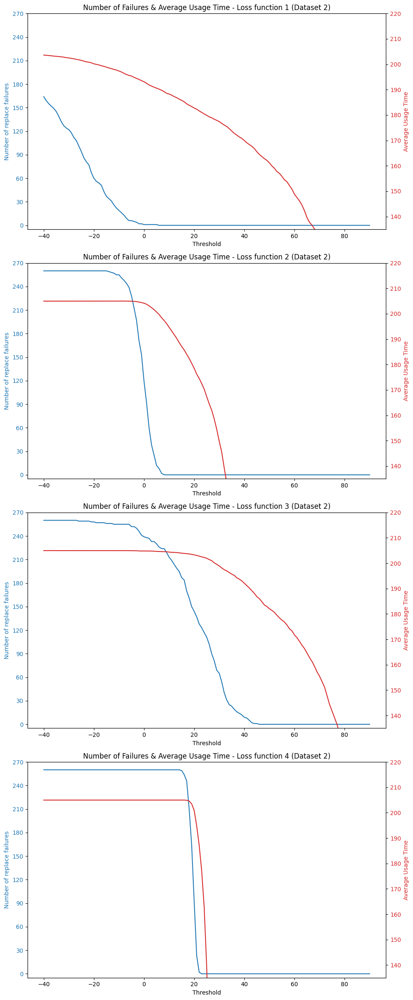

In [66]:
fig, axs = plt.subplots(len(full_nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(full_nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Number of failures)
    color = 'tab:blue'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Number of replace failures', color=color)
    ax1.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Number of replace failures'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax1.set_ylim(-1,104) ### for Dataset1
    ax1.set_ylim(-5,270) ### for Dataset2
    #ax1.set_ylim(-1,104) ### for Dataset3
    #ax1.set_ylim(-5,260) ### for Dataset4

    # 오른쪽 Y축 그래프 (Average Usage Time)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Average Usage Time', color=color)
    ax2.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Average usage time'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax2.set_ylim(150,220) ### for Dataset1
    ax2.set_ylim(135,220) ### for Dataset2
    #ax2.set_ylim(190,260) ### for Dataset3
    #ax2.set_ylim(180,260) ### for Dataset4

    # 그래프 제목 설정
    #ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 1)')
    ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 2)')
    #ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 3)')
    #ax1.set_title(f'Number of Failures & Average Usage Time - Loss function {i} (Dataset 4)')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()

Average Cost

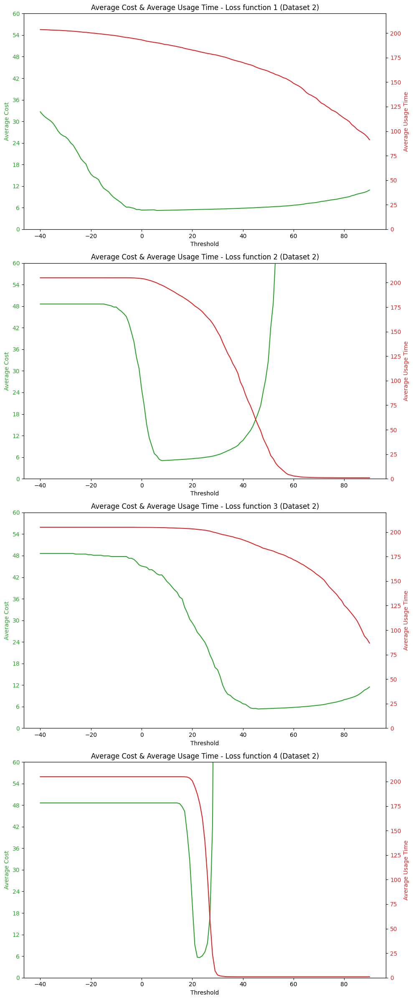

In [67]:
fig, axs = plt.subplots(len(full_nan_counts_and_cost_df_list), 1, figsize=(10, 6*len(full_nan_counts_and_cost_df_list)))

# 데이터프레임들을 저장한 리스트인 nan_counts_and_cost_df_list 내의 각 데이터프레임에 대해 반복 수행
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list, start=1):
    ax1 = axs[i-1]

    # 왼쪽 Y축 그래프 (Average Cost)
    color = 'tab:green'
    ax1.set_xlabel('Threshold')
    ax1.set_ylabel('Average Cost', color=color)
    ax1.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Total Cost'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax1.set_ylim(0,60) ### for dataset1
    ax1.set_ylim(0,60) ### for dataset2
    #ax1.set_ylim(0,60) ### for dataset3
    #ax1.set_ylim(0,60) ### for dataset4
    """
    # 오른쪽 Y축 그래프 (Total Number of Engines Used)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Total Number of Engines Used', color=color)
    ax2.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Last index'] + 1, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    ax2.set_ylim(75,100)
    """
    # 오른쪽 Y축 그래프 (Average Usage Time)
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Average Usage Time', color=color)
    ax2.plot(full_nan_counts_and_cost_df['Threshold'], full_nan_counts_and_cost_df['Average usage time'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.yaxis.set_major_locator(MaxNLocator(integer=True))  # 눈금을 정수로 표시
    #ax2.set_ylim(150,220) ### for Dataset1
    ax2.set_ylim(0,220) ### for Dataset2
    #ax2.set_ylim(190,260) ### for Dataset3
    #ax2.set_ylim(-0.5,260) ### for Dataset4

    # 그래프 제목 설정
    #ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 1)')
    ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 2)')
    #ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 3)')
    #ax1.set_title(f'Average Cost & Average Usage Time - Loss function {i} (Dataset 4)')

# 그래프 보이기
plt.tight_layout()  # subplot 간격 조정
plt.show()

**Scatter Plot - (Number of Failures vs. Average usage time)**

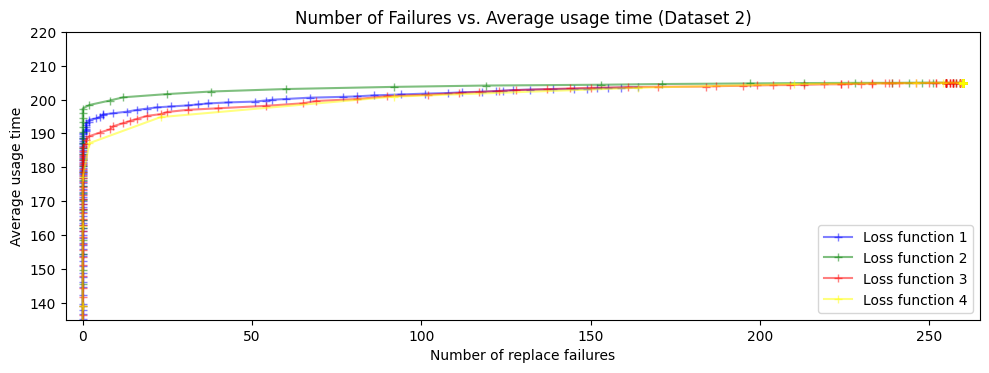

In [68]:
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(10, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'],
        '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
#ax.set_ylim(150,220) ### for dataset1
ax.set_ylim(135,220) ### for dataset2
#ax.set_ylim(190,248) ### for dataset3
#ax.set_ylim(180,260) ### for dataset4

#ax.set_xlim(-5,105) ### for dataset1,3
ax.set_xlim(-5,265) ### for dataset2
#ax.set_xlim(-5,255) ### for dataset4

# Set aspect ratio to make the plot square
ax.set_aspect('equal')

# Show the plot
plt.tight_layout()
plt.show()

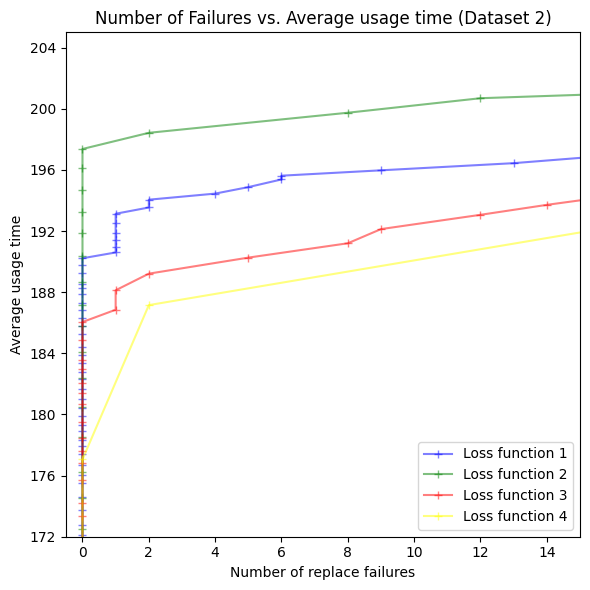

In [69]:
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(6, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'], '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))

#ax.set_ylim(191,203) ### for dataset1
ax.set_ylim(172,205) ### for dataset2
#ax.set_ylim(226,240) ### for dataset3
#ax.set_ylim(190,237) ### for dataset4
ax.set_xlim(-0.5,15)

# Set aspect ratio to make the plot square
#ax.set_aspect('equal')

# Show the plot
plt.tight_layout()
plt.show()

# What is the best policy parameter?


**Experiment 1 - Gaussian Smoothing**

(Dataset 3, Loss function 2, Theta = 10)

(Dataset 4, Loss function 2, Theta = 10)

In [94]:
# Importing the library for using the 'deepcopy' method.
import copy

# Through the 'deepcopy' method, I assigned different addresses to lr2 and lr5, making them independent objects.
lr5 = copy.deepcopy(lr2)   # loss function 2의 w,b를 lr5에 저장
threshold_theta = 10       # initial theta = 10

# Hyper Parameter
GS_lr = 0.0001                  # learning rate
sd = 0.01                      # standard deviation
num_of_epsilon = 7              # for expectation -> mean(epsilon 1, epsilon 2, ... , epsilon n)
coef_of_MSE_w = 0.0005         # penalty term of MSE(W)
coef_of_MSE_b = 0.0001          # penalty term of MSE(b)
coef_of_MSE_theta = 0.0001      # penalty term of MSE(theta)

# save initial parameter (for calculate MSE)
initial_parameter = copy.deepcopy(lr5)
initial_theta = threshold_theta

# print
print(lr5.coef_)          # coef_ : w (21-dim)
print(lr5.intercept_)     # intercept_ : b (1-dim)
print(threshold_theta)

[ 2.22441324e+02 -3.90673813e+02 -8.15435236e+01 -1.59425084e+02
 -1.53968283e+03 -1.33519510e+02  6.83204564e+02 -2.06818664e+02
 -1.00261362e+02 -5.46378978e+01 -2.80386690e+02  6.52647692e+02
 -1.73752730e+02  2.59693661e+00 -2.35709612e+02  3.18145254e-01
 -1.00847620e+02  1.66233768e+03 -8.64849520e+02  1.33763155e+02
  1.74065329e+02]
564.2443828397601
10


Scalar 값을 입력으로 받는 MSE 함수 정의

In [83]:
def mean_squared_error_scalar(y_true, y_pred):
    mse = (y_true - y_pred) ** 2
    return mse

In [ ]:
# test code
"""
print(( GS_lr * ( ( gradient_w / (sd ** 2) ) + coef_of_MSE_w * (initial_parameter.coef_ - lr5.coef_) ) ))
print(( GS_lr * ( ( gradient_b / (sd ** 2)) + coef_of_MSE_b * (initial_parameter.intercept_ - lr5.intercept_) ) ))
print(( GS_lr * ( ( gradient_theta / (sd ** 2) ) + coef_of_MSE_theta * (initial_theta - threshold_theta) ) ))

print( GS_lr * ( ( gradient_w / (sd ** 2))))
print( GS_lr * ( ( gradient_b / (sd ** 2))))
print( GS_lr * ( ( gradient_theta / (sd ** 2))))
"""

'\nprint(( GS_lr * ( ( gradient_w / (sd ** 2) ) + coef_of_MSE_w * (initial_parameter.coef_ - lr5.coef_) ) ))\nprint(( GS_lr * ( ( gradient_b / (sd ** 2)) + coef_of_MSE_b * (initial_parameter.intercept_ - lr5.intercept_) ) ))\nprint(( GS_lr * ( ( gradient_theta / (sd ** 2) ) + coef_of_MSE_theta * (initial_theta - threshold_theta) ) ))\n\nprint( GS_lr * ( ( gradient_w / (sd ** 2))))\nprint( GS_lr * ( ( gradient_b / (sd ** 2))))\nprint( GS_lr * ( ( gradient_theta / (sd ** 2))))\n'

In [95]:
## 'Epsilon 여러개 뽑는 version' + 'penalty term'으로 convergence 안정화 ##

# Initialize the DataFrame to store results
simul_result_df = pd.DataFrame(columns=['W', 'b', 'Theta', 'Average usage time', 'Average cost', 'Number of failure'])

# Define the number of iterations (n)
n = 1000  # Change this to the desired number of iterations

for i in range(n):
    # Epsilon ~ N(0,0.1)
    epsilon_w = np.mean([np.random.normal(0, sd, 21) for _ in range(num_of_epsilon)], axis=0)
    epsilon_b = np.mean([np.random.normal(0, sd, 1) for _ in range(num_of_epsilon)])
    epsilon_theta = np.mean([np.random.normal(0, sd, 1) for _ in range(num_of_epsilon)])

    lr5.coef_ += epsilon_w
    lr5.intercept_ += epsilon_b
    threshold_theta += epsilon_theta

    y_full_prediction = lr5.predict(X_full_1_s)

    # Merge dataframe (label + data)
    y_full_prediction_df = pd.DataFrame(y_full_prediction, columns=['predicted RUL'])
    merged_full_prediction_df = pd.concat([X_full_index_names, y_full_prediction_df, y_full], axis=1)

    cumulative_operation_time = 0
    total_cost = 0
    average_cost = 0

    by_threshold_full_prediction_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])
    grouped = merged_full_prediction_df.groupby('unit_number')

    for unit, group in grouped:
        operation_time = None
        max_RUL = group['RUL'].max()

        for index, row in group.iterrows():
            if row['predicted RUL'] <= threshold_theta:
                operation_time = row['time_cycles']
                cumulative_operation_time += operation_time
                total_cost += REPLACE_COST
                break

        if pd.isna(operation_time):
            cumulative_operation_time += max_RUL
            total_cost += FAILURE_COST

        average_cost = (total_cost / cumulative_operation_time)
        by_threshold_full_prediction_df = by_threshold_full_prediction_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                                                  'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                                                  'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

    simul_average_usage_time = by_threshold_full_prediction_df['Cumulative Operation Time'].iloc[-1] / (len(by_threshold_full_prediction_df.index) + 1)
    simul_average_cost_by_threshold = by_threshold_full_prediction_df['Average Cost'].iloc[-1]
    simul_nan_count = by_threshold_full_prediction_df.loc[:, 'actual operation time'].isna().sum()

    # 앞에서 넣은 epsilon을 다시 제거하고, 원래의 parameter로 되돌림.
    lr5.coef_ -= epsilon_w
    lr5.intercept_ -= epsilon_b
    threshold_theta -= epsilon_theta

    # Expectation 내의 gradient 부분만 계산
    gradient_w = simul_average_cost_by_threshold * epsilon_w          # "f(w+eps, b+eps, theta+eps) * [ epsilon vector ]"에서 w 부분
    gradient_b = simul_average_cost_by_threshold * epsilon_b          # b 부분
    gradient_theta = simul_average_cost_by_threshold * epsilon_theta  # theta 부분


    # test code
    #print(( GS_lr * ( ( gradient_w / (sd ** 2) ) + coef_of_MSE_w * (initial_parameter.coef_ - lr5.coef_) ) ))
    #print(( GS_lr * ( ( gradient_b / (sd ** 2)) + coef_of_MSE_b * (initial_parameter.intercept_ - lr5.intercept_) ) ))
    #print(( GS_lr * ( ( gradient_theta / (sd ** 2) ) + coef_of_MSE_theta * (initial_theta - threshold_theta) ) ))

    #print( GS_lr * ( ( gradient_w / (sd ** 2))))
    #print( GS_lr * ( ( gradient_b / (sd ** 2))))
    #print( GS_lr * ( ( gradient_theta / (sd ** 2))))


    # [W,b,theta] update  # 여기에 MSE penalty를 넣어줘야 함.
    lr5.coef_ -= ( GS_lr * ( ( gradient_w / (sd ** 2) ) + coef_of_MSE_w * (initial_parameter.coef_ - lr5.coef_) ) )
    lr5.intercept_ -= ( GS_lr * ( ( gradient_b / (sd ** 2)) + coef_of_MSE_b * (initial_parameter.intercept_ - lr5.intercept_) ) )
    threshold_theta -= ( GS_lr * ( ( gradient_theta / (sd ** 2) ) + coef_of_MSE_theta * (initial_theta - threshold_theta) ) )

    # Append the results to the DataFrame
    simul_result_df = simul_result_df.append({'Iteration' : i + 1, 'W': lr5.coef_.tolist(), 'b': lr5.intercept_.item(), 'Theta': threshold_theta.item(),
                                              'Average usage time': simul_average_usage_time, 'Average cost': simul_average_cost_by_threshold,
                                              'Number of failure': simul_nan_count}, ignore_index=True)

  #  print("Iteration : ", i + 1, "Average usage time : ", "{:.3f}".format(simul_average_usage_time),
  #        ", Average cost : ", "{:.3f}".format(simul_average_cost_by_threshold), ", Number of failures : ", simul_nan_count )

In [96]:
# Print or use the simul_result_df as needed
print(simul_result_df)

                                                     W           b      Theta  \
0    [222.43902540145123, -390.6625430561452, -81.5...  564.264883  10.048128   
1    [222.44920522869936, -390.65694944152267, -81....  564.223018  10.049259   
2    [222.42674050174307, -390.6590401425844, -81.5...  564.248823  10.044080   
3    [222.44287782943988, -390.6369439712108, -81.5...  564.253587  10.031894   
4    [222.45249412860673, -390.6532616176259, -81.6...  564.246469  10.036014   
..                                                 ...         ...        ...   
995  [223.04375131391313, -390.3228824753328, -81.2...  565.041066  10.897593   
996  [223.06468849940683, -390.3313585654285, -81.2...  565.047488  10.914777   
997  [223.0664202034908, -390.34313605499665, -81.2...  565.048098  10.891359   
998  [223.07404177224183, -390.37317696311976, -81....  565.053603  10.894270   
999  [223.10023846332115, -390.36876704421627, -81....  565.034511  10.906364   

     Average usage time  Av

In [97]:
# Find optimal parameter
optimal_average_cost_row = simul_result_df.iloc[simul_result_df['Average cost'].idxmin()]
print(optimal_average_cost_row)

W                     [223.4444303205205, -390.3639064162257, -81.45...
b                                                            564.926513
Theta                                                         10.940906
Average usage time                                           196.214559
Average cost                                                   5.076935
Number of failure                                                     0
Iteration                                                         837.0
Name: 836, dtype: object


In [98]:
optimal_average_cost_row['W']

[223.4444303205205,
 -390.3639064162257,
 -81.45983248656755,
 -158.6211772324008,
 -1539.7453539853582,
 -131.90486115673468,
 683.0713092211932,
 -207.1893854327574,
 -100.31229074375807,
 -54.69772757743759,
 -280.74976531569956,
 653.2338304231386,
 -172.9940935341874,
 2.677101444814993,
 -236.56355073927722,
 1.02599409107598,
 -101.30942530999502,
 1661.9108475392416,
 -864.2819937193095,
 134.17470493112685,
 174.3825382843349]

In [ ]:
#optimal_average_cost_row = simul_result_df.iloc[0]
#optimal_average_cost_row['W']

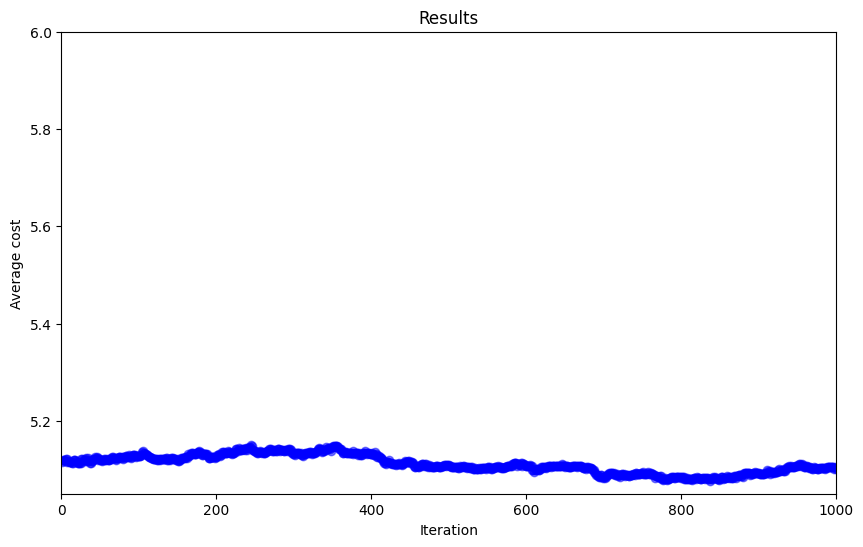

In [105]:
plt.figure(figsize=(10, 6))

# 'Iteration'을 x축으로, 'Average cost'을 y축으로 하는 그래프 그리기
plt.plot(simul_result_df['Iteration'], simul_result_df['Average cost'],
         marker='o', color='b', alpha=0.5)

# 그래프에 레이블 추가
plt.xlabel('Iteration')
plt.ylabel('Average cost')
plt.title('Results')

plt.ylim(5.05, 6)
plt.xlim(0, 1000)

# 그래프 표시
#plt.grid(True)  # 그리드 추가
plt.show()

**Plot에 optimal point 찍어보기**

"Optimal parameter로 성능 재현"

In [100]:
#optimal_parameter = simul_result_df.iloc[213]    # optimal row
optimal_parameter = optimal_average_cost_row  # optimal row
optimal_w = np.array(optimal_parameter['W'])     # optimal paramter에서 W 추출
optimal_b = optimal_parameter['b']     # optimal paramter에서 b 추출
optimal_theta = optimal_parameter['Theta'] # optimal paramter에서 Theta

lr5.coef_ = optimal_w
lr5.intercept_ = optimal_b
threshold_theta = optimal_theta

y_optimal_prediction = lr5.predict(X_full_1_s)

 # Merge dataframe (label + data)
y_optimal_prediction_df = pd.DataFrame(y_optimal_prediction, columns=['predicted RUL'])
merged_optimal_prediction_df = pd.concat([X_full_index_names, y_optimal_prediction_df, y_full], axis=1)

cumulative_operation_time = 0
total_cost = 0
average_cost = 0


by_threshold_optimal_prediction_df = pd.DataFrame(columns=['unit_number', 'actual operation time', 'actual RUL', 'Cumulative Operation Time', 'Total Cost'])
grouped = merged_optimal_prediction_df.groupby('unit_number')

for unit, group in grouped:
    operation_time = None
    max_RUL = group['RUL'].max()

    for index, row in group.iterrows():
        if row['predicted RUL'] <= threshold_theta:
            operation_time = row['time_cycles']
            cumulative_operation_time += operation_time
            total_cost += REPLACE_COST
            break

    if pd.isna(operation_time):
        cumulative_operation_time += max_RUL
        total_cost += FAILURE_COST

    average_cost = (total_cost / cumulative_operation_time)
    by_threshold_optimal_prediction_df = by_threshold_optimal_prediction_df.append({'unit_number': unit, 'actual operation time': operation_time,
                                                                              'actual RUL': max_RUL, 'Cumulative Operation Time': cumulative_operation_time,
                                                                              'Average Cost' : average_cost, 'Total Cost': total_cost}, ignore_index=True)

optimal_average_usage_time = by_threshold_optimal_prediction_df['Cumulative Operation Time'].iloc[-1] / (len(by_threshold_optimal_prediction_df.index) + 1)
optimal_average_cost_by_threshold = by_threshold_optimal_prediction_df['Average Cost'].iloc[-1]
optimal_number_of_failure = by_threshold_optimal_prediction_df.loc[:, 'actual operation time'].isna().sum()


print("Optimal : ", "Average usage time : ", "{:.3f}".format(optimal_average_usage_time),
      ", Average cost : ", "{:.3f}".format(optimal_average_cost_by_threshold), ", Number of failures : ", optimal_number_of_failure )

Optimal :  Average usage time :  196.046 , Average cost :  5.081 , Number of failures :  0


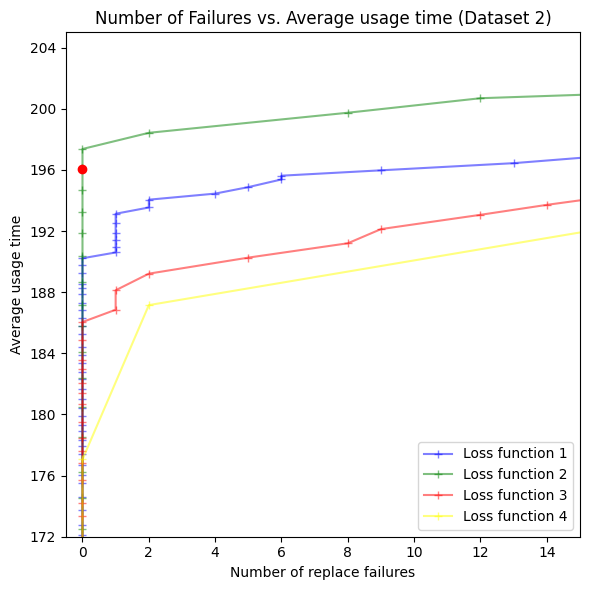

In [101]:
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(6, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'], '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))

#ax.set_ylim(191,203) ### for dataset1
ax.set_ylim(172,205) ### for dataset2
#ax.set_ylim(226,240) ### for dataset3
#ax.set_ylim(190,237) ### for dataset4
ax.set_xlim(-0.5,15)

# Set aspect ratio to make the plot square
#ax.set_aspect('equal')


###########################################################################################

optimal_x = optimal_number_of_failure
optimal_y = optimal_average_usage_time

# Plot a point using the extracted values
ax.plot(
    optimal_x,
    optimal_y,
    'ro',  # 'ro'는 빨간색 원형 점.
    label='Optimal Point'
)
###########################################################################################

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
# epsilon이 포함된 상태에서의 optimal NoF와 Average usage time (실제 저장된 w,b,theta를 이용한 값이 아님)
"""
# Create a list of colors for each dataframe
colors = ['blue', 'green', 'red', 'yellow']

fig, ax = plt.subplots(figsize=(6, 6))

# Loop through the dataframes and plot scatter points with different colors
for i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):
    ax.plot(
        full_nan_counts_and_cost_df['Number of replace failures'],
        full_nan_counts_and_cost_df['Average usage time'], '+-',
        label=f'Loss function {i + 1}',
        color=colors[i],
        alpha=0.5
    )

# Set labels and title
ax.set_xlabel('Number of replace failures')
ax.set_ylabel('Average usage time')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')
ax.set_title('Number of Failures vs. Average usage time (Dataset 3)')
#ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')

# Add legend
ax.legend()

# Set integer ticks for y-axes
ax.yaxis.set_major_locator(MaxNLocator(integer=True))

#ax.set_ylim(191,203) ### for dataset1
#ax.set_ylim(172,205) ### for dataset2
ax.set_ylim(226,240) ### for dataset3
#ax.set_ylim(190,237) ### for dataset4
ax.set_xlim(-0.5,15)

# Set aspect ratio to make the plot square
#ax.set_aspect('equal')

###########################################################################################
# Extract data from a specific row of result_df (e.g., row 50)
optimal_point_row = simul_result_df.iloc[213]  # Change the index to the desired row number

optimal_x = optimal_point_row['Number of failure']
optimal_y = optimal_point_row['Average usage time']

# Plot a point using the extracted values
ax.plot(
    optimal_x,
    optimal_y,
    'ro',  # 'ro'는 빨간색 원형 점.
    label='Optimal Point'
)
###########################################################################################

# Show the plot
plt.tight_layout()
plt.show()
"""

"\n# Create a list of colors for each dataframe\ncolors = ['blue', 'green', 'red', 'yellow']\n\nfig, ax = plt.subplots(figsize=(6, 6))\n\n# Loop through the dataframes and plot scatter points with different colors\nfor i, full_nan_counts_and_cost_df in enumerate(full_nan_counts_and_cost_df_list):\n    ax.plot(\n        full_nan_counts_and_cost_df['Number of replace failures'],\n        full_nan_counts_and_cost_df['Average usage time'], '+-',\n        label=f'Loss function {i + 1}',\n        color=colors[i],\n        alpha=0.5\n    )\n\n# Set labels and title\nax.set_xlabel('Number of replace failures')\nax.set_ylabel('Average usage time')\n#ax.set_title('Number of Failures vs. Average usage time (Dataset 1)')\n#ax.set_title('Number of Failures vs. Average usage time (Dataset 2)')\nax.set_title('Number of Failures vs. Average usage time (Dataset 3)')\n#ax.set_title('Number of Failures vs. Average usage time (Dataset 4)')\n\n# Add legend\nax.legend()\n\n# Set integer ticks for y-axes\nax

# Policy-based RL (REINFORCE Algorithm)

Stochastic policy version

In [ ]:
# Train dataset을 적절히 나눠서 Train, Test를 진행 (RUL prediction에서는 70:30 적용했음).
# Train dataset에서 unit을 변경하며 cumulative reward의 최대화 수행.

# Time cycle 10,000 (혹은 1,000)으로 고정해서 RL을 적용 (Threshold도 함께 학습)
# Threshold를 학습하려면 REINFORE Alg. 같은 stochastic policy가 아니라, Deterministic Policy based RL style로 가야하지 않을까?
# Deterministic policy based로 다시 생각해보자.
# Deterministic policy Gradient Algorithm (DPG; 2014)



Importing libraries (RL)

REINFORCE Algorithm

In [ ]:
# policy control parameter theta, y_bar (threshold도 학습의 대상으로 parameter에 들어감)